
## Imports

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import time
from collections import defaultdict

import torch
import torch.nn as nn
from torch.nn import functional as F
import torch.utils.data as data_utils
from sklearn.linear_model import LinearRegression, Ridge, RidgeCV, Lasso
import sklearn
from torch.utils.data.sampler import SubsetRandomSampler

import sys,os
sys.path.append(os.path.abspath("/mnt/home/yjo10/ceph/CAMELS/MIEST/utils/"))
from imp import reload 
# Change in mymodule/'

import callback
reload(callback)
from callback import *
import vib_utils
reload(vib_utils)
from vib_utils import *
import mist_utils
reload(mist_utils)
from mist_utils import *



warnings.filterwarnings('ignore')

# Device Config
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
field = 'Mtot';
sim   = ['TNG','SIMBA'] #['TNG', 'SIMBA']
norm = True
mono = True
fe=0.3;fd=0.1;z_dim=600;dr=0.1
average=False
projection=True
fname = "ASTRID_TNG_{}_test".format(field)
mist = MIST(sim=sim,field=field, normalization=norm, monopole=mono, average=average, data_type='wph',
            L=4, dn=0, projection=projection,batch_size=128,guide_output=False)
mist.train(which_machine='vib+cls',tol=1e-5,z_dim=z_dim,hidden1=fe, hidden2=fd,dr=dr,
           patience=50, gamma=1e-3, beta=1e-2,epochs=5000,learning_rate=1e-3, fname=fname, save_plot=True
           , save_model=False)

epoch 0   | loss: 6.43924  | accuracy: 0.01344  | val_loss: 8.72114  | Om_m: 1.11312  | sig8: 0.38721 
50 0 0.0 0.16098102519386692
50 0 0.0 0.02

epoch 1   | loss: 4.93282  | accuracy: 0.00804  | val_loss: 7.65326  | Om_m: 0.80921  | sig8: 0.32528 
50 0 0.7532099203059546 0.14215077718621805
50 0 0.0008337872841880367 0.02

epoch 2   | loss: 4.18927  | accuracy: 0.00672  | val_loss: 7.01612  | Om_m: 0.73071  | sig8: 0.27605 
50 0 0.8347526488945499 0.1296778008603213
50 0 0.002845993930028564 0.02

epoch 3   | loss: 3.59119  | accuracy: 0.00596  | val_loss: 6.41979  | Om_m: 0.62359  | sig8: 0.22707 
50 0 0.897900700569153 0.11970325967198923
50 0 0.0036992362508476984 0.02

epoch 4   | loss: 3.07473  | accuracy: 0.00542  | val_loss: 5.7236   | Om_m: 0.59449  | sig8: 0.17342 
50 0 0.9924640404550654 0.11113627592199726
50 0 0.004526019721848575 0.02

epoch 5   | loss: 2.69818  | accuracy: 0.00509  | val_loss: 5.74083  | Om_m: 0.58562  | sig8: 0.15768 
50 0 1.0328724881013234 0.10385598

In [1]:
mist.make_plots() # Adam 1e-3 z_dim=1000
y_true, y_pred = mist.test_on(sims="ASTRID", fname="0.01", data_return=True,show_plot=True, 
                                      show_score=False, save_plot=False)

NameError: name 'mist' is not defined

In [78]:
y_pred[0].shape, y_pred[1].shape

((1000, 3), (1000, 3))

(array([ 41.,  94., 104.,  96.,  87.,  80.,  80.,  83., 116., 219.]),
 array([0.11111026, 0.15453118, 0.19795209, 0.241373  , 0.2847939 ,
        0.32821485, 0.37163576, 0.41505668, 0.45847762, 0.5018985 ,
        0.54531944], dtype=float32),
 <BarContainer object of 10 artists>)

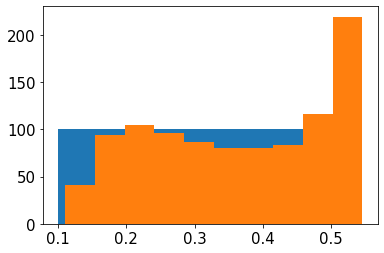

In [79]:
plt.hist(y_true[:,0])
plt.hist(y_pred[0][:,0])


In [81]:
y_pred[0][:,0]>0.5

array([ True, False, False,  True,  True, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False,  True, False, False, False, False, False,
       False, False, False, False, False,  True,  True,  True, False,
       False, False, False, False, False, False, False,  True, False,
       False, False, False,  True, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
        True, False, False, False, False, False,  True, False, False,
       False, False, False, False, False, False,  True, False, False,
       False, False, False,  True, False, False, False,  True, False,
       False, False, False, False, False, False, False,  True,  True,
       False, False, False, False, False, False, False,  True, False,
        True, False, False, False, False, False,  True, False, False,
        True, False, False, False, False, False,  True, False, False,
       False,  True,

In [18]:
mist.input.shape

(2000, 3105)

In [11]:
field = 'HI';
sim   = ['TNG','SIMBA'] #['TNG', 'SIMBA']
norm = True
mono = True
fe=0.3;fd=0.6;z_dim=400;dr=0.1
average=True
projection=False
fname = "ASTRID_TNG_{}_test".format(field)
mist = MIST(sim=sim,field=field, normalization=norm, monopole=mono, average=average, data_type='wph',
            L=4, dn=0, projection=projection,batch_size=128)
mist.train(which_machine='vib+cls',tol=1e-5,z_dim=z_dim,hidden1=fe, hidden2=fd,dr=dr,
           patience=50, gamma=1e-2, beta=1,epochs=3000,learning_rate=1e-3, fname=fname, save_plot=True
           , save_model=False)

epoch 0   | loss: 5.67396  | accuracy: 0.01085  | val_loss: 5.60097  | Om_m: 0.75363  | sig8: 0.31217 
epoch 1   | loss: 3.56351  | accuracy: 0.00622  | val_loss: 4.11781  | Om_m: 0.64695  | sig8: 0.23332 
epoch 2   | loss: 3.12559  | accuracy: 0.00544  | val_loss: 3.94001  | Om_m: 0.59801  | sig8: 0.21528 
epoch 3   | loss: 2.93949  | accuracy: 0.00536  | val_loss: 4.08952  | Om_m: 0.60936  | sig8: 0.20623 
epoch 4   | loss: 2.73783  | accuracy: 0.00492  | val_loss: 3.67348  | Om_m: 0.54312  | sig8: 0.19735 
epoch 5   | loss: 2.70778  | accuracy: 0.00493  | val_loss: 3.97892  | Om_m: 0.59209  | sig8: 0.2264  
epoch 6   | loss: 2.56367  | accuracy: 0.00477  | val_loss: 3.68668  | Om_m: 0.52227  | sig8: 0.20891 
epoch 7   | loss: 2.59733  | accuracy: 0.00474  | val_loss: 3.52289  | Om_m: 0.50497  | sig8: 0.19868 
epoch 8   | loss: 2.41626  | accuracy: 0.00458  | val_loss: 3.52333  | Om_m: 0.5274   | sig8: 0.19944 
epoch 9   | loss: 2.31759  | accuracy: 0.00444  | val_loss: 3.27908  | Om

True

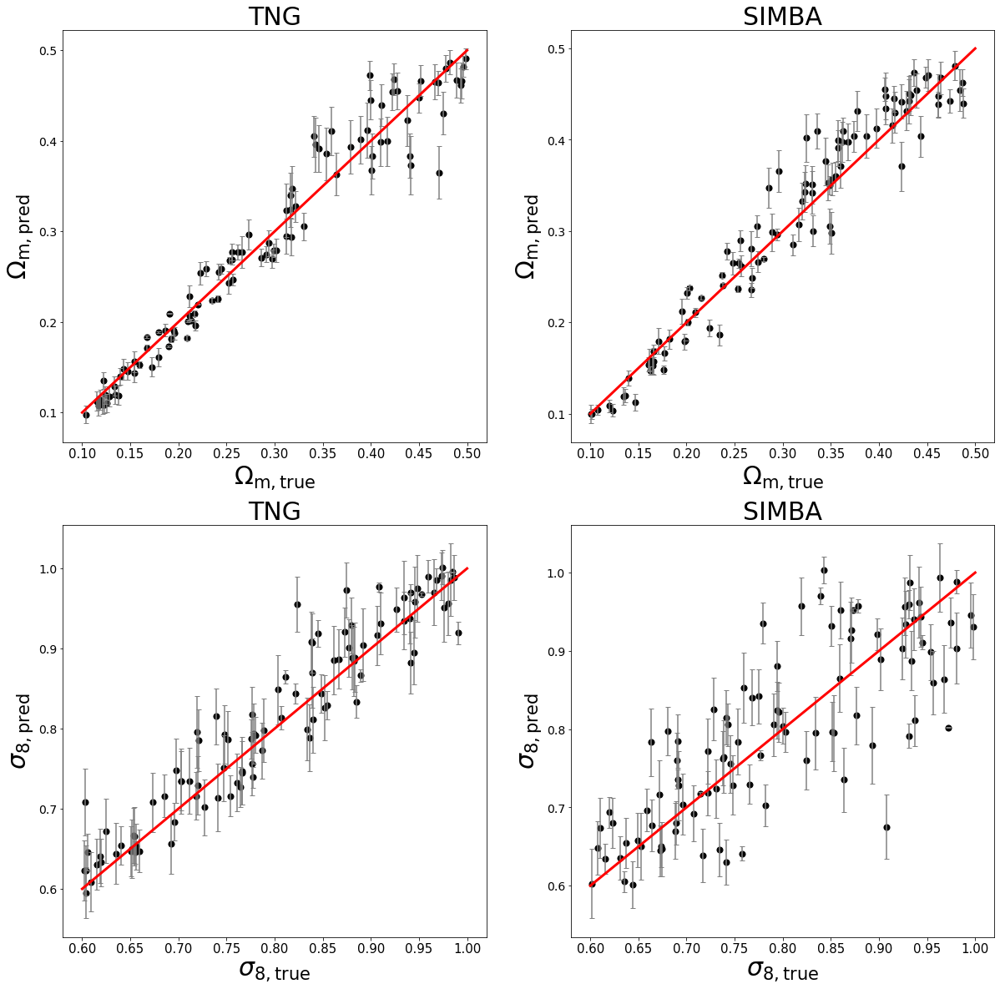

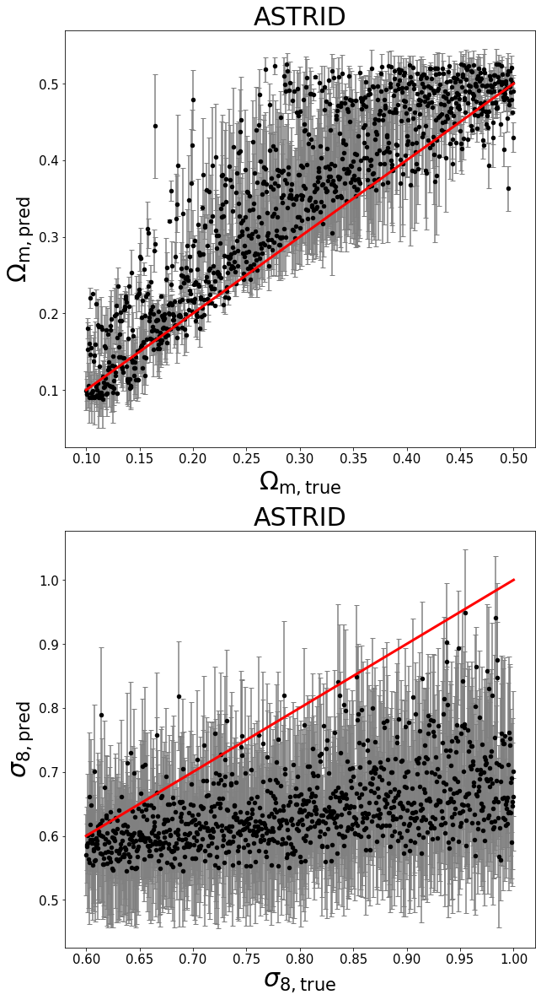

In [12]:
mist.make_plots() # Adam 1e-3 z_dim=1000
mist.test_on(sims="ASTRID", fname="0.01", data_return=False,show_plot=True, 
                                      show_score=False, save_plot=False)

epoch 0   | loss: 4.2224   | accuracy: 0.01071  | val_loss: 5.67242  | Om_m: 0.75455  | sig8: 0.22631 
epoch 1   | loss: 3.08158  | accuracy: 0.00731  | val_loss: 5.34802  | Om_m: 0.6946   | sig8: 0.2378  
epoch 2   | loss: 2.83086  | accuracy: 0.00678  | val_loss: 4.56681  | Om_m: 0.54349  | sig8: 0.20997 
epoch 3   | loss: 2.38981  | accuracy: 0.00599  | val_loss: 4.03067  | Om_m: 0.49615  | sig8: 0.17551 
epoch 4   | loss: 1.75254  | accuracy: 0.00504  | val_loss: 3.73318  | Om_m: 0.41812  | sig8: 0.18027 
epoch 5   | loss: 1.38647  | accuracy: 0.00464  | val_loss: 3.40879  | Om_m: 0.42256  | sig8: 0.15989 
epoch 6   | loss: 1.00187  | accuracy: 0.0042   | val_loss: 3.05491  | Om_m: 0.35647  | sig8: 0.15794 
epoch 7   | loss: 0.8478   | accuracy: 0.00406  | val_loss: 3.20165  | Om_m: 0.32663  | sig8: 0.16465 
epoch 8   | loss: 0.70051  | accuracy: 0.00388  | val_loss: 2.96476  | Om_m: 0.35588  | sig8: 0.1527  
epoch 9   | loss: 0.55371  | accuracy: 0.0037   | val_loss: 2.5853   | Om

KeyboardInterrupt: 

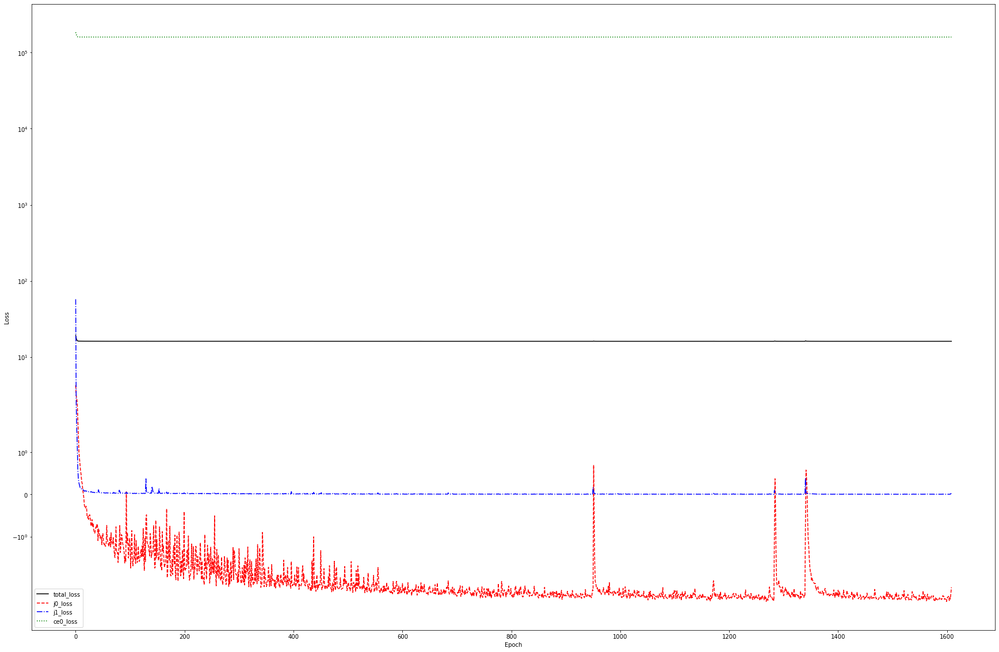

In [2]:
field = 'HI';
sim   = 'ASTRID' #['TNG', 'SIMBA']
norm = True
mono = False
fe=0.3;fd=0.6;z_dim=400;dr=0.1
average=False
fname = "ASTRID_{}_test".format(sim, field)
mist = MIST(sim=sim,field=field, normalization=norm, monopole=mono, average=average, data_type='wph',
            L=4, dn=0, projection=True)
mist.train(which_machine='vib',tol=1e-5,z_dim=z_dim,hidden1=fe, hidden2=fd,dr=dr,
           patience=50, gamma=1e-2, beta=1,epochs=3000,learning_rate=1e-3, fname=fname, save_plot=True
           , save_model=False)

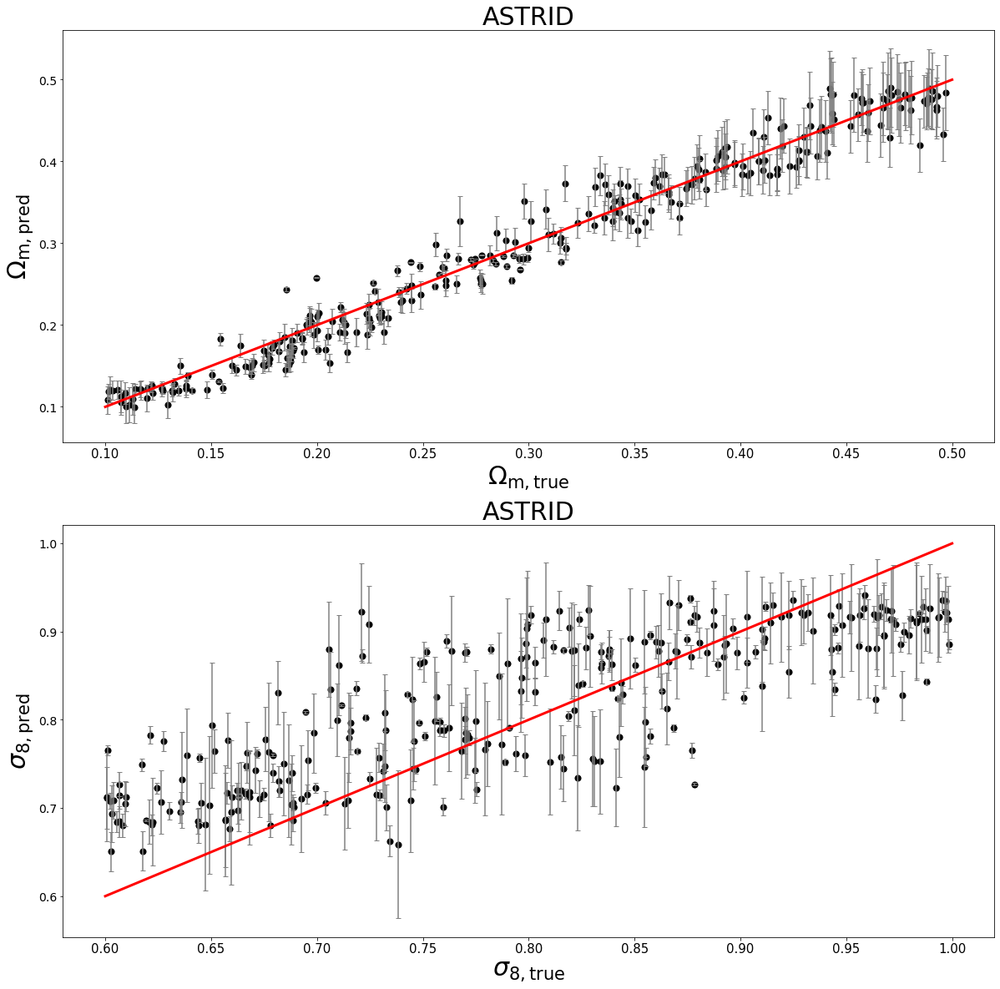

In [3]:
mist.make_plots() # Adam 1e-3 z_dim=1000

In [95]:
field = 'HI';
sim   = 'ASTRID' #['TNG', 'SIMBA']
norm = True
mono = False
fe=0.3;fd=0.6;z_dim=400;dr=0.1
average=False
fname = "ASTRID_{}_test".format(sim, field)
mist = MIST(sim=sim,field=field, normalization=norm, monopole=mono, average=average, data_type='wph',
            L=4, dn=0, projection=True)
mist.train(which_machine='vib',tol=1e-5,z_dim=z_dim,hidden1=fe, hidden2=fd,dr=dr,
           patience=50, gamma=1e-2, beta=1,epochs=3000,learning_rate=1e-3, fname=fname, save_plot=True
           , save_model=False)

epoch 0   | loss: 4.92879  | accuracy: 0.0121   | val_loss: 5.30915  | Om_m: 0.77984  | sig8: 0.19417 
epoch 1   | loss: 3.06379  | accuracy: 0.00773  | val_loss: 4.81931  | Om_m: 0.78056  | sig8: 0.17723 
epoch 2   | loss: 2.51254  | accuracy: 0.00672  | val_loss: 4.6231   | Om_m: 0.64004  | sig8: 0.17725 
epoch 3   | loss: 1.91378  | accuracy: 0.00559  | val_loss: 3.98518  | Om_m: 0.51463  | sig8: 0.17432 
epoch 4   | loss: 1.41313  | accuracy: 0.0049   | val_loss: 3.25944  | Om_m: 0.38693  | sig8: 0.14742 
epoch 5   | loss: 1.08955  | accuracy: 0.00448  | val_loss: 3.31778  | Om_m: 0.42787  | sig8: 0.14636 
epoch 6   | loss: 0.82577  | accuracy: 0.00419  | val_loss: 2.96518  | Om_m: 0.35013  | sig8: 0.14748 
epoch 7   | loss: 0.66703  | accuracy: 0.00399  | val_loss: 2.689    | Om_m: 0.33078  | sig8: 0.136   
epoch 8   | loss: 0.53468  | accuracy: 0.00388  | val_loss: 2.78078  | Om_m: 0.35481  | sig8: 0.14271 
epoch 9   | loss: 0.41368  | accuracy: 0.0037   | val_loss: 2.56013  | Om

KeyboardInterrupt: 

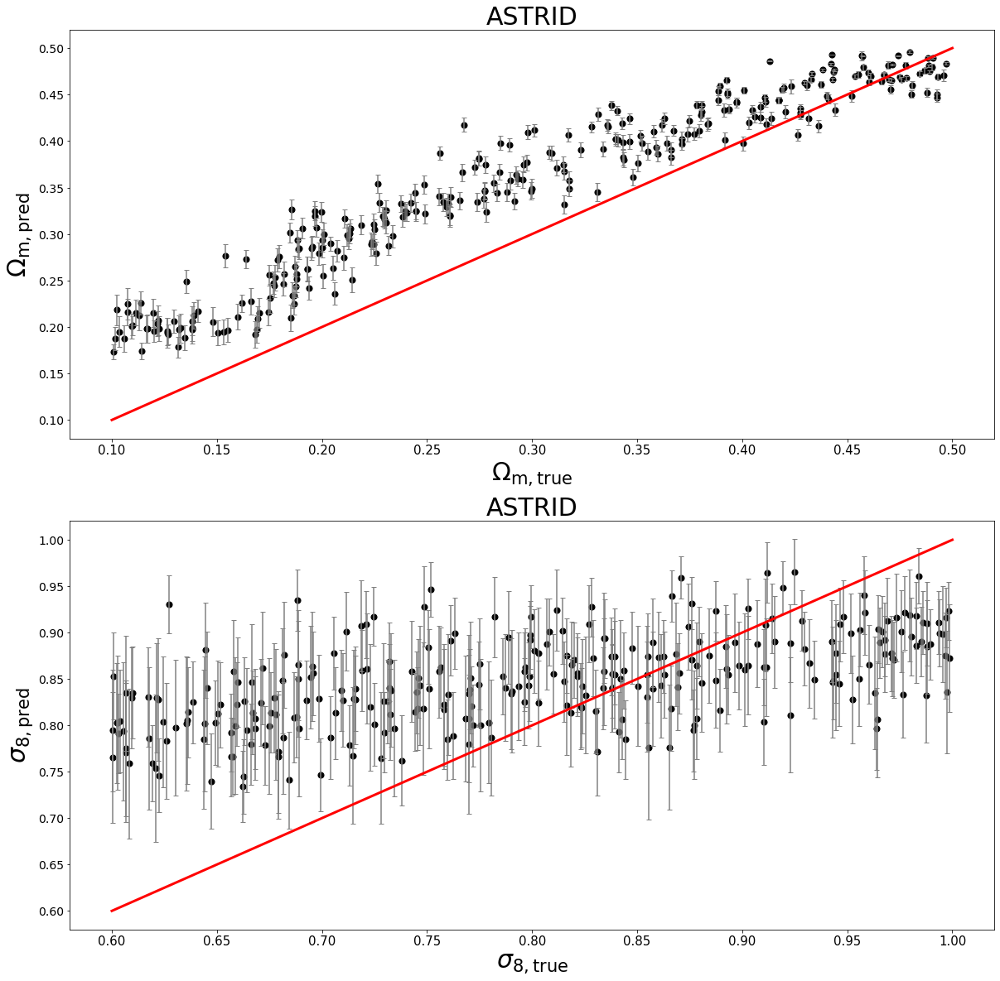

In [96]:
mist.make_plots() # Adam 1e-3 z_dim=1000

In [4]:
field = 'HI';
sim   = ['TNG', 'SIMBA']
norm = True
mono = False
fe=0.3;fd=0.6;z_dim=400;dr=0.1
average=False
fname = "TNG_SIMBA_{}_test".format(sim, field)
mist = MIST(sim=sim,field=field, normalization=norm, monopole=mono, average=average, data_type='wph',
            L=4, dn=0, projection=True)
mist.train(which_machine='vib+cls', tol=1e-5,z_dim=z_dim,hidden1=fe, hidden2=fd,dr=dr,
           patience=50, gamma=1e-2, beta=1,epochs=3000,learning_rate=1e-3)
#mist.retrain(tol=1e-7,patience=50,epochs=3000,learning_rate=1e-5)

epoch 0   | loss: 4.02859  | accuracy: 0.01077  | val_loss: 6.62351  | Om_m: 0.67653  | sig8: 0.2264  
epoch 1   | loss: 2.63088  | accuracy: 0.00646  | val_loss: 6.05123  | Om_m: 0.55547  | sig8: 0.19735 


KeyboardInterrupt: 

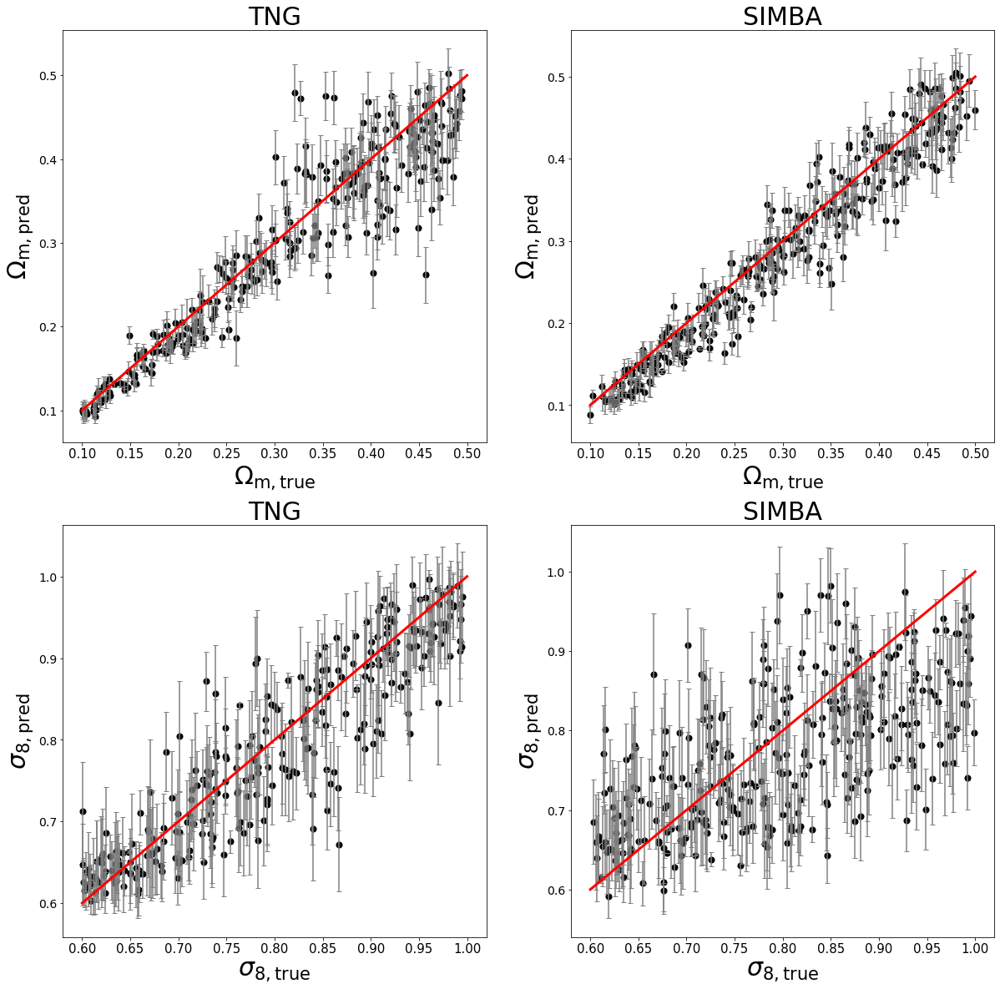

In [34]:
mist.make_plots()

In [45]:
a[1][1].shape

(3000, 2)

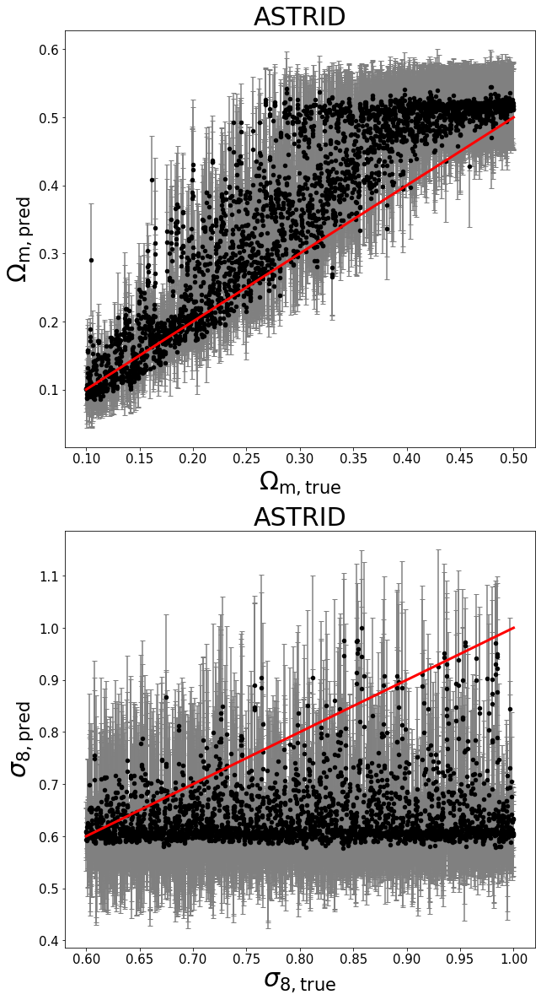

In [36]:
a = mist.test_on(sims="ASTRID", fname="0.01", data_return=True,show_plot=True, show_score=False, save_plot=False)

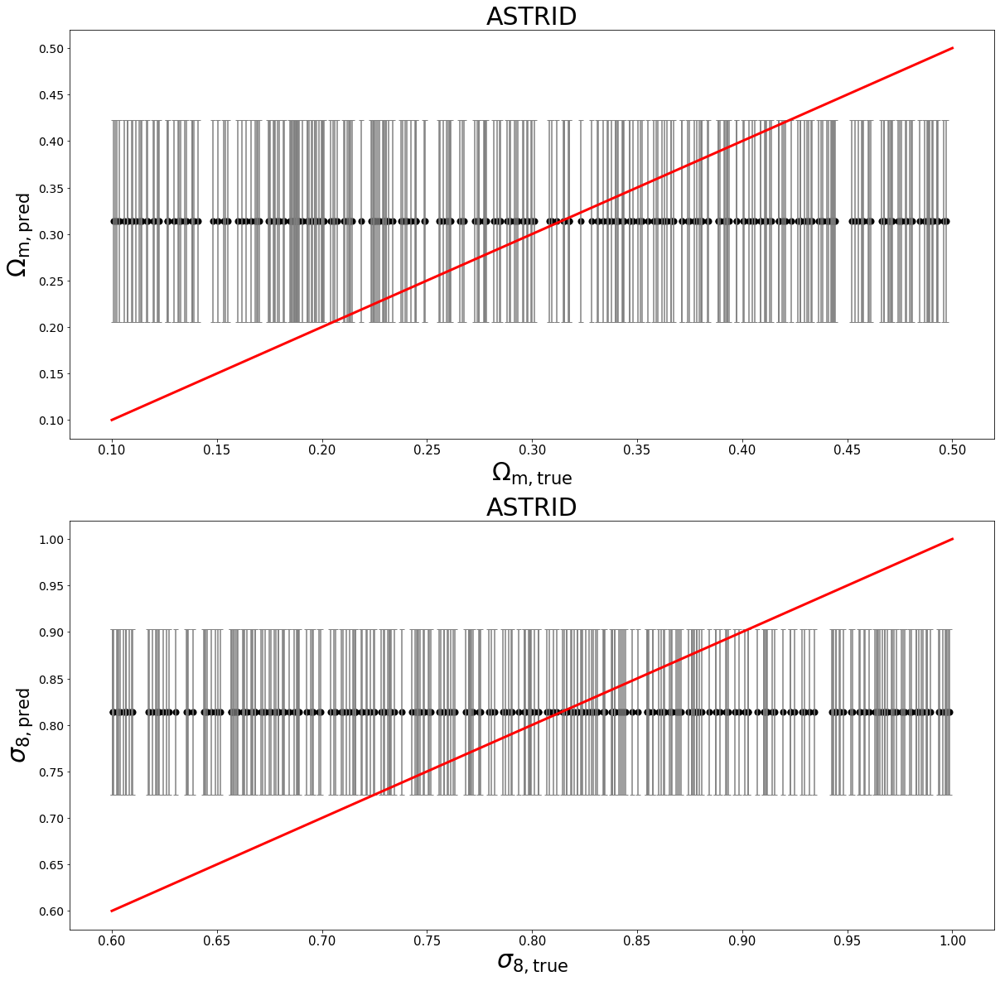

In [52]:
mist.make_plots() # Adam 1e-3 z_dim=1000

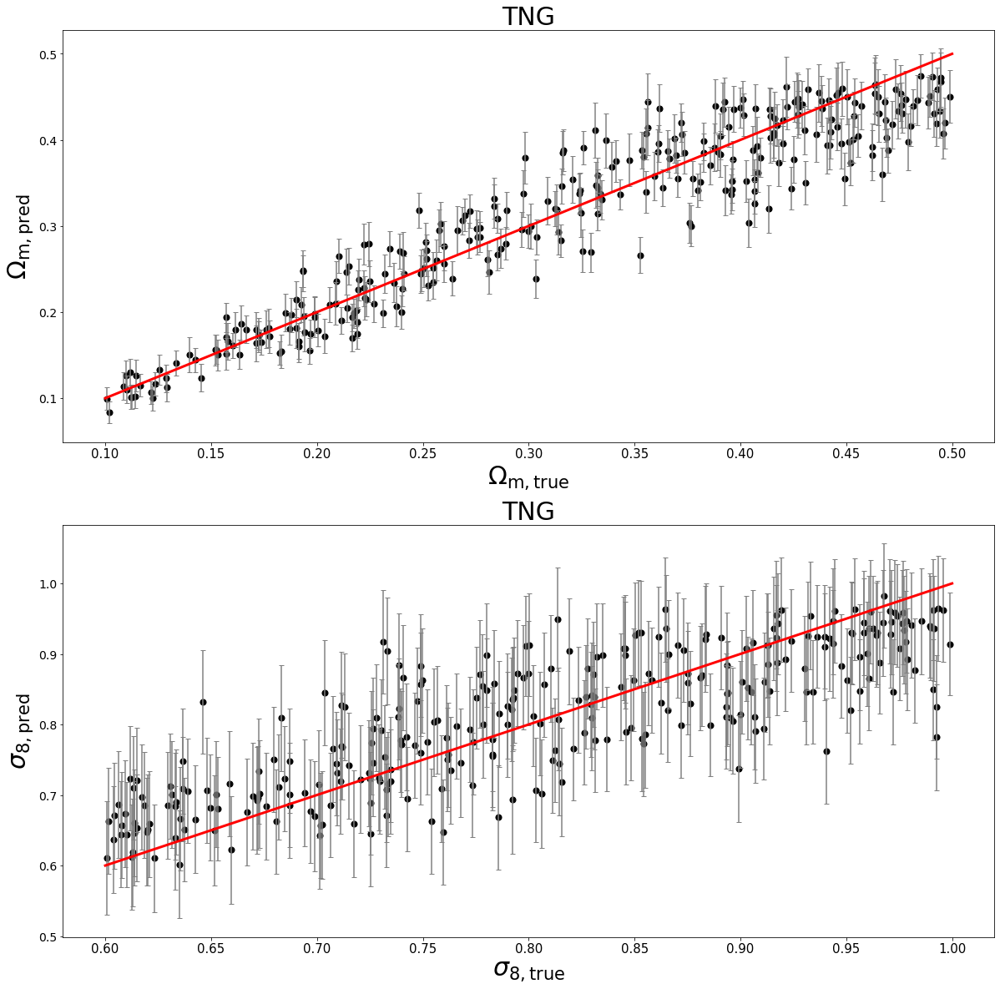

In [264]:
mist.make_plots() # Adam 1e-3 l = 10 dn=4

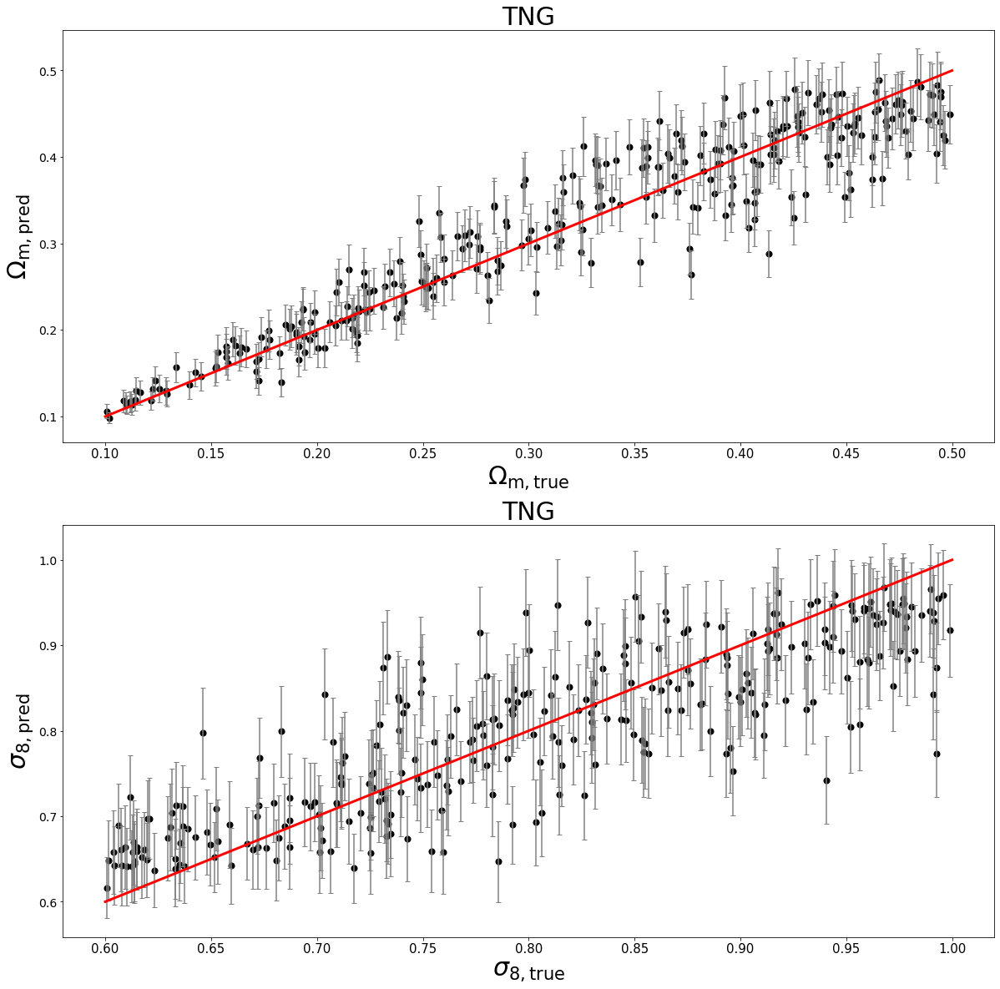

In [254]:
mist.make_plots() # Adam 1e-3 val_loss j1 modif gamma 1e-3

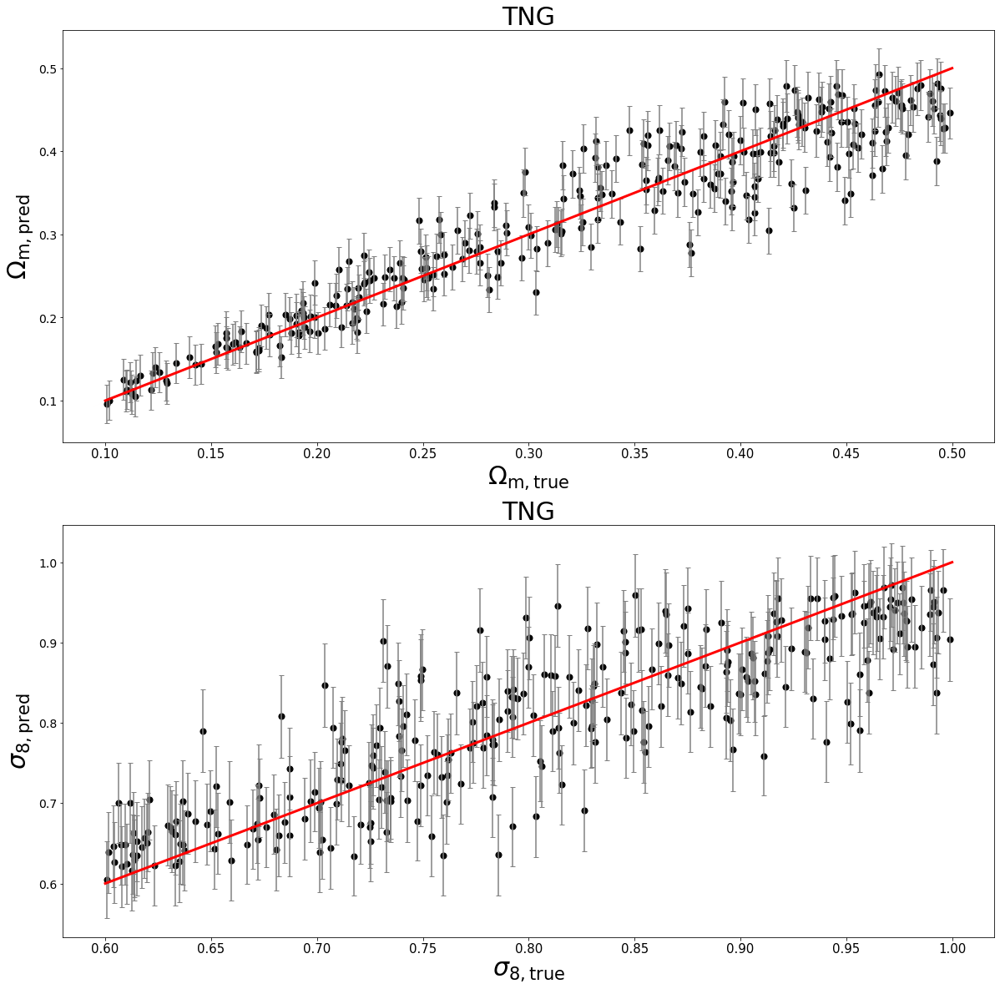

In [251]:
mist.make_plots() # Adam 1e-5 val_loss j1 modif

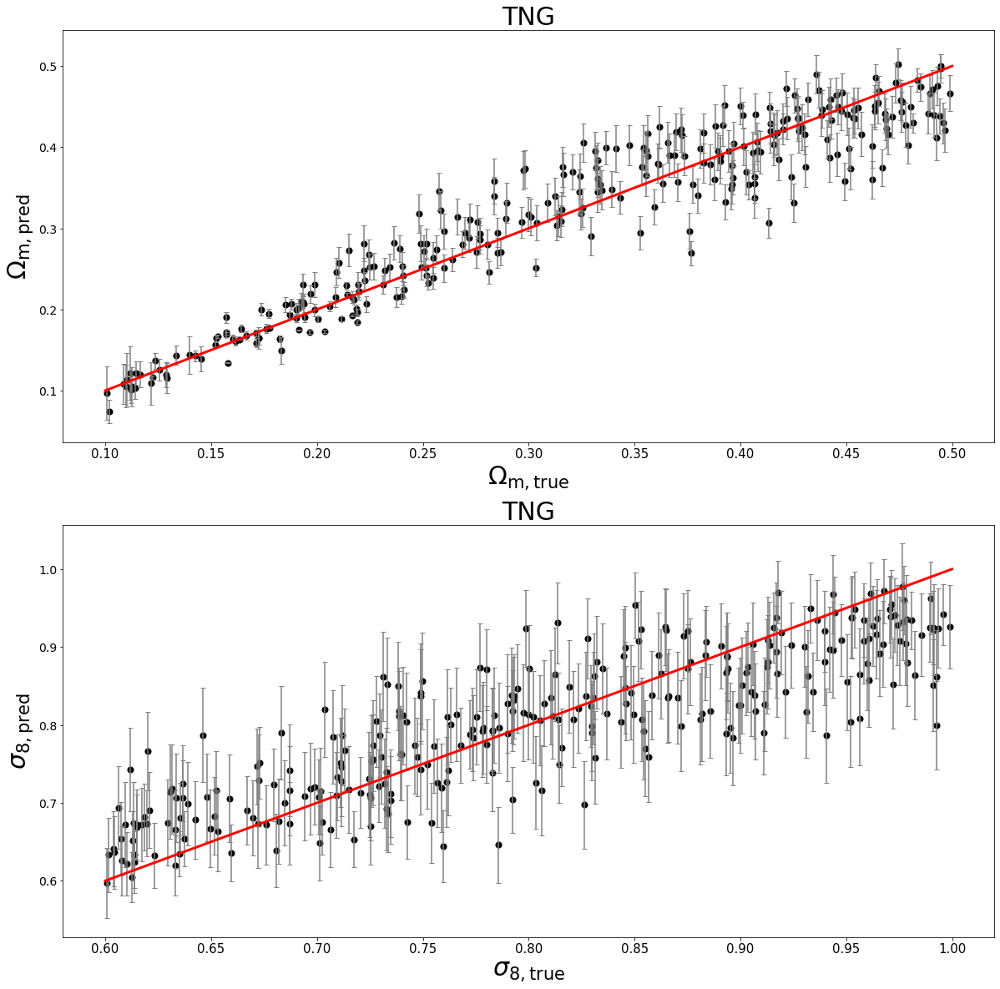

In [240]:
mist.make_plots() # Adam 1e-4 val_loss

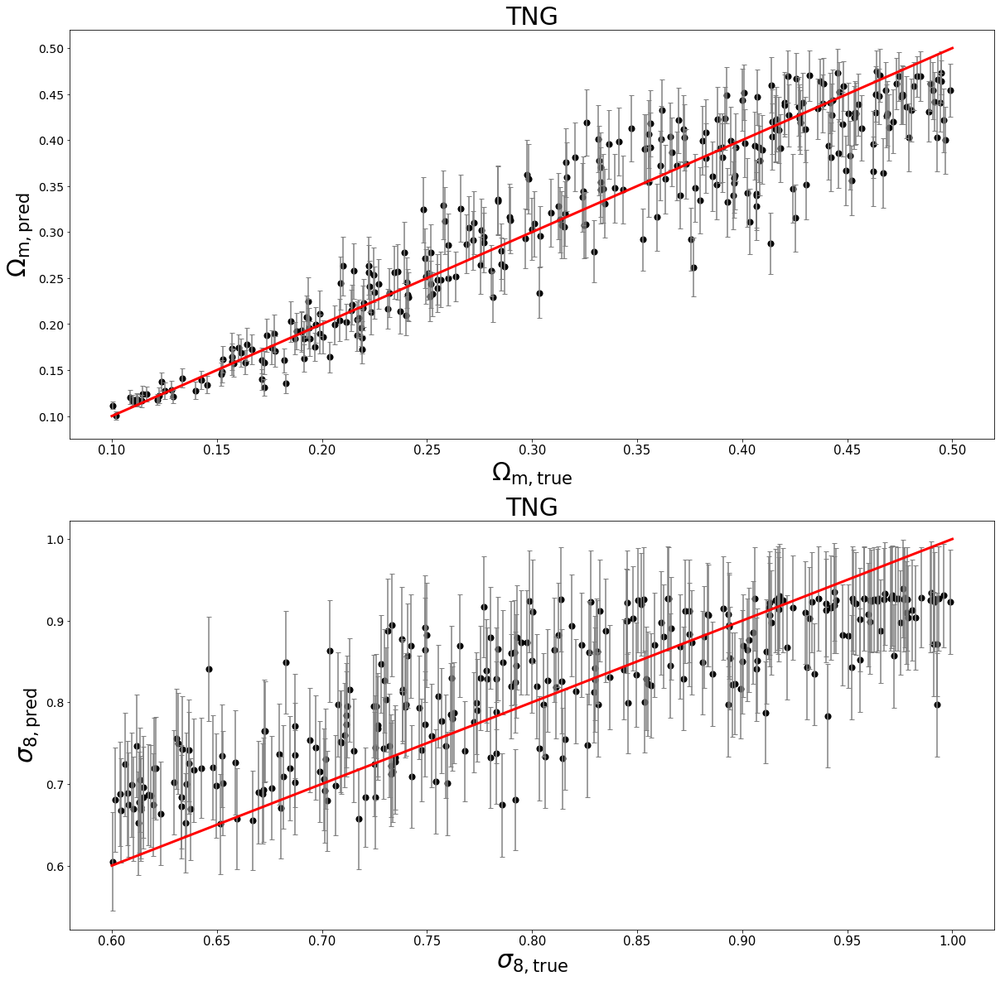

In [238]:
mist.make_plots() # Adam 1e-3 val_loss

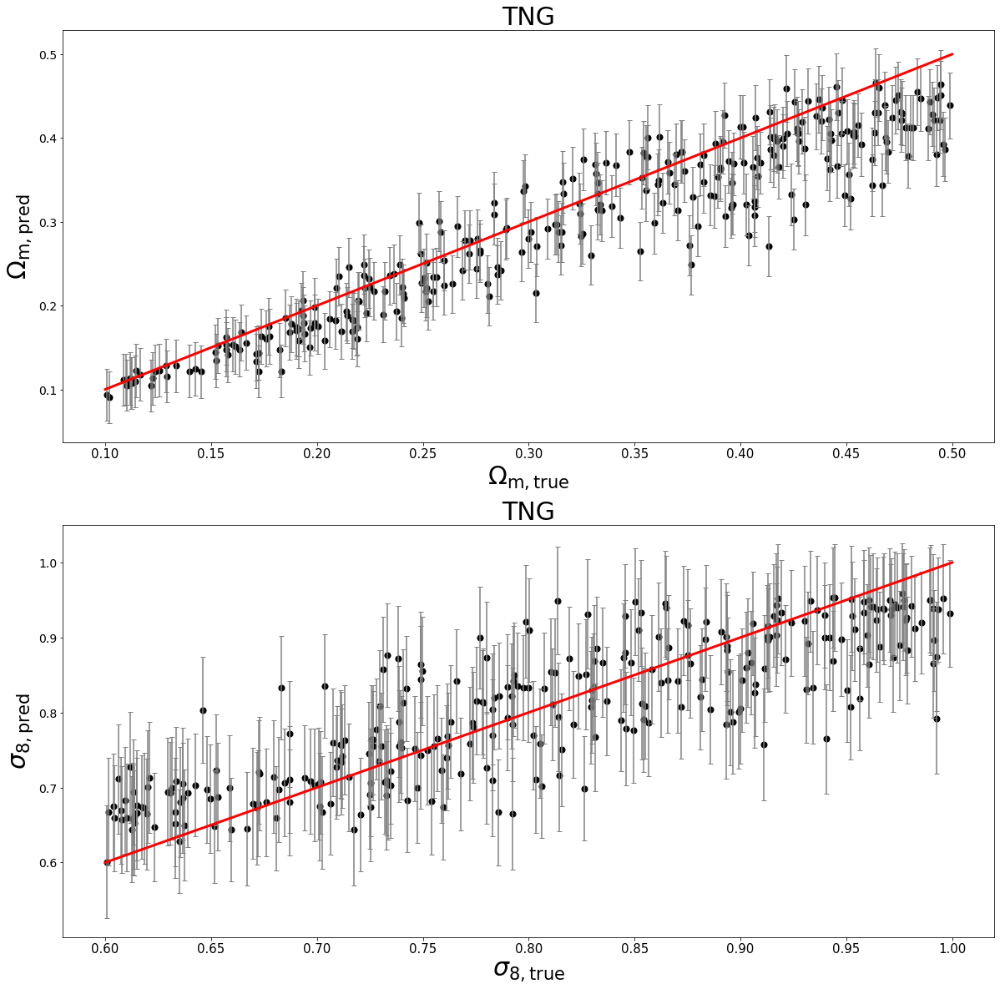

In [228]:
mist.make_plots() # Adam 1e-3

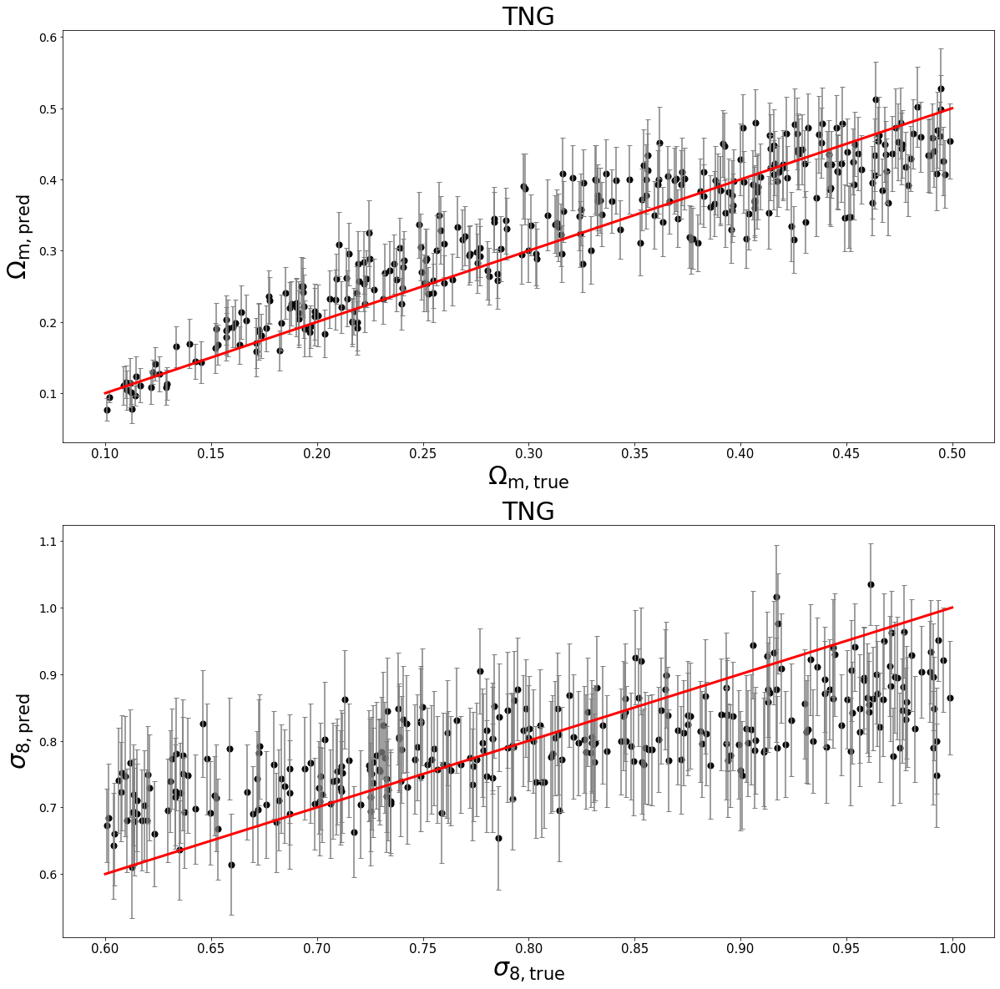

In [220]:
mist.make_plots()

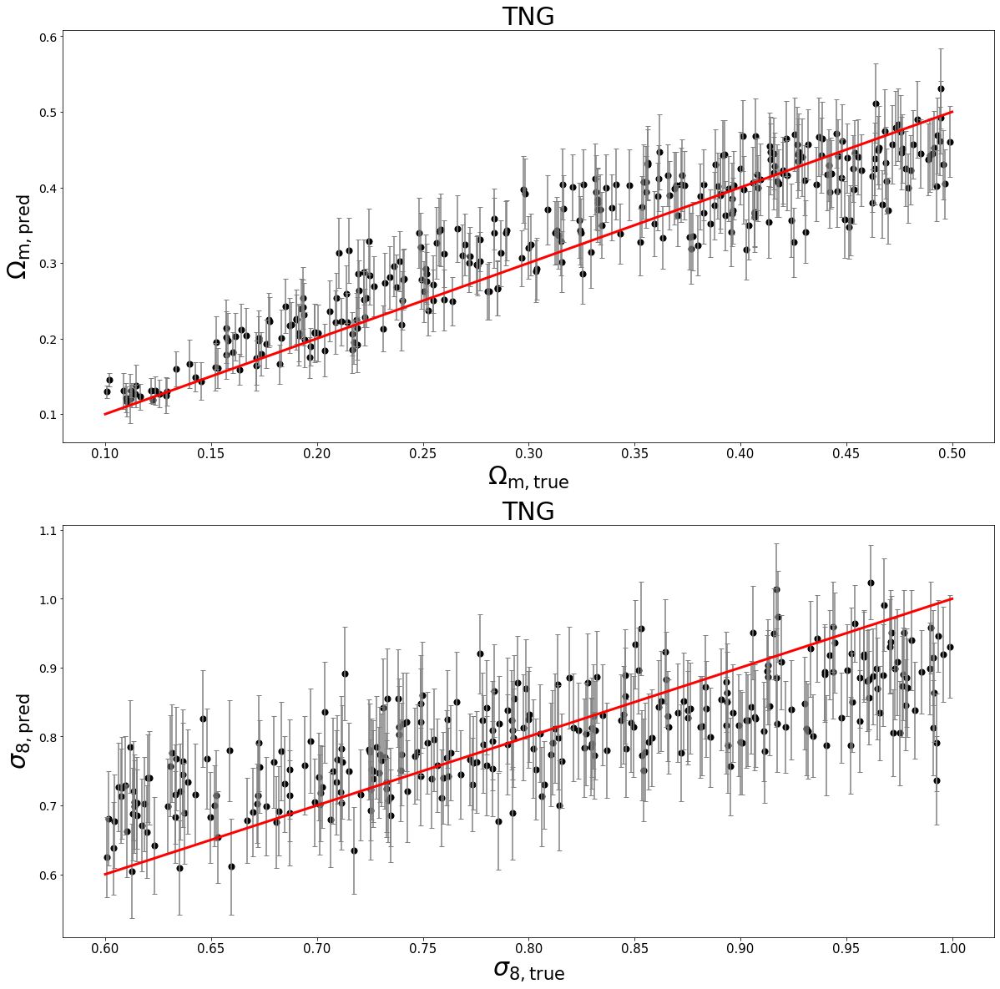

In [218]:
mist.make_plots()  # SGD

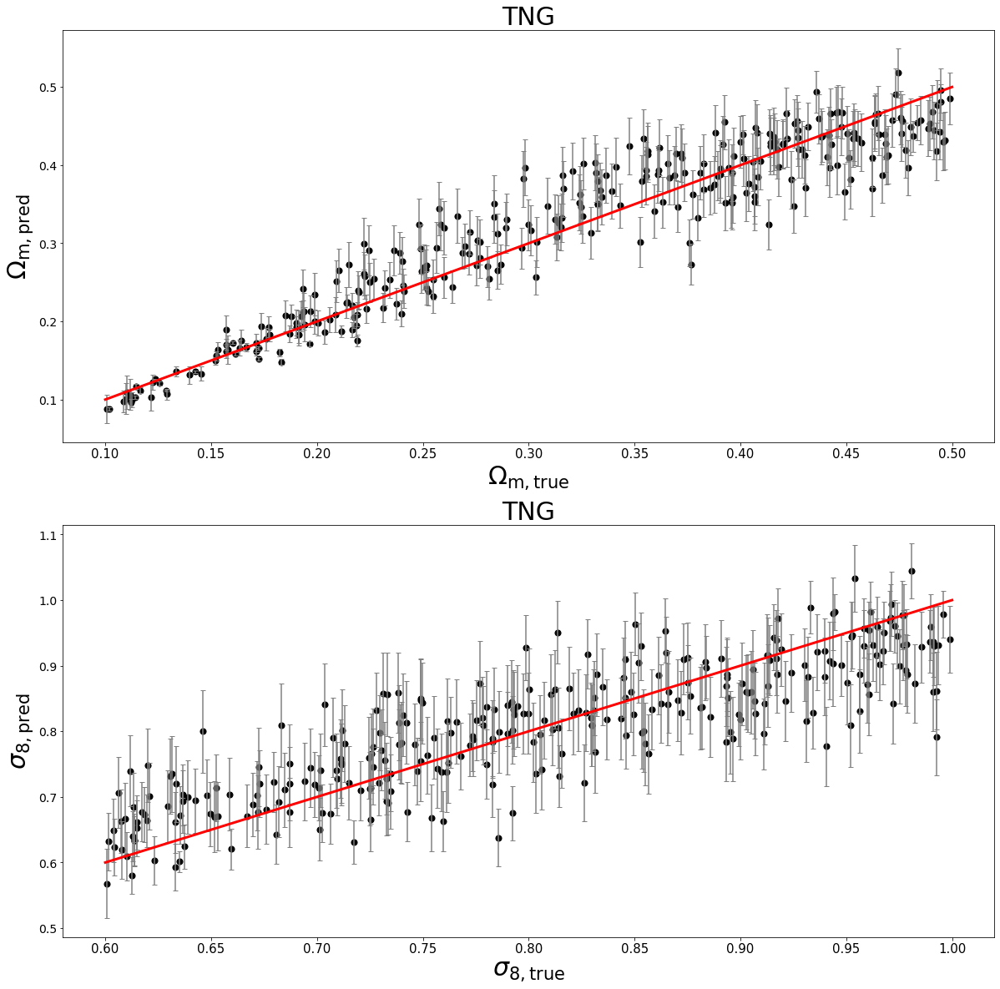

In [215]:
mist.make_plots() # ADAM 1e-4

In [128]:
import sys,os 
import matplotlib.pyplot as plt
import numpy as np
sys.path.append(os.path.abspath("/mnt/home/yjo10/ceph/myutils/"))
from plt_utils import generateAxesForMultiplePlots, remove_inner_axes
from scipy.stats import pearsonr
from sklearn.metrics import mean_squared_error, r2_score
from scipy.stats import chi2_contingency

In [29]:
def metric(arr):
    return arr[2]+arr[3]

In [64]:
field = 'Mtot';
sim   = 'TNG' #['TNG', 'SIMBA']
norm = True
mono = True
h    = 1
average=True
fname = "search/{}_{}_mono_{}_norm_{}_h_{}_img".format(sim, field, int(mono),int(norm),h)
mist = MIST(sim=sim,field=field, normalization=norm, monopole=mono, average=average, data_type='wph', projection=False)
mist.train(which_machine='vib', beta=0)

TypeError: unsupported operand type(s) for +: 'float' and 'tuple'

In [47]:
?mist.train

Signature:
mist.train(
    which_machine='vib+cls',
    fname='test',
    beta=1,
    gamma=0.01,
    learning_rate=0.001,
    decay_rate=0.97,
    z_dim=200,
    epochs=3000,
    hidden=1,
    dr=0.5,
    channels=1,
    verbose=True,
    save_plot=True,
    save_model=True,
    n_estimators=10,
    max_depth=4,
    loss_fn=None,
)
Docstring: <no docstring>
File:      ~/ceph/CAMELS/MIEST/utils/mist_utils.py
Type:      method


In [38]:
mist.input.shape

(1000, 6210)

## batch run for making plots should be implemented

In [31]:
field = 'T';
sim   = 'TNG'
norm = True
mono = True
h    = 1
average=False
fname = "search/{}_{}_mono_{}_norm_{}_h_{}_img".format(sim, field, int(mono),int(norm),h)
mist = MIST(sim=sim,field=field, extended_L=False, normalization=norm, monopole=mono, average=average, data_type='image')
mist.load_models(fname=fname, which_machine='vib_cnn',z_dim=200, hidden=h, dr=0.5)
mist.make_plots(show_plot=True, data_return=False)
#mist.test_on(sims="ASTRID", fname="0.01", data_return=False,show_plot=True, show_score=False, save_plot=False)a

TypeError: __init__() got an unexpected keyword argument 'extended_L'

In [15]:
mist.input.shape

(1000, 3105)

In [44]:
field = 'Mtot';
sim   = 'TNG'
norm = True
mono = True
h    = 2
average=True
z_dim = 1000
fname = "search/{}_{}_mono_{}_norm_{}_h_{}_new".format(sim, field, int(mono),int(norm),h)
mist = MIST(sim=sim,field=field, normalization=norm, monopole=mono, average=average, projection=True, L=4, dn=0)
mist.load_models(fname=fname, which_machine='vib',z_dim=z_dim, hidden=h, dr=0.5)
mist.make_plots(show_plot=True, data_return=False)
#mist.test_on(sims="ASTRID", fname="0.01", data_return=False,show_plot=True, show_score=False, save_plot=False)

You can't use monopole with projection!
Turning off monopole...
You can't use average with projection!
Turning off average...


FileNotFoundError: [Errno 2] No such file or directory: '/mnt/home/yjo10/ceph/CAMELS/MIEST/data/wph_pIllustrisTNG_Mtot_for_vib_total_l_4_dn_0.npy'

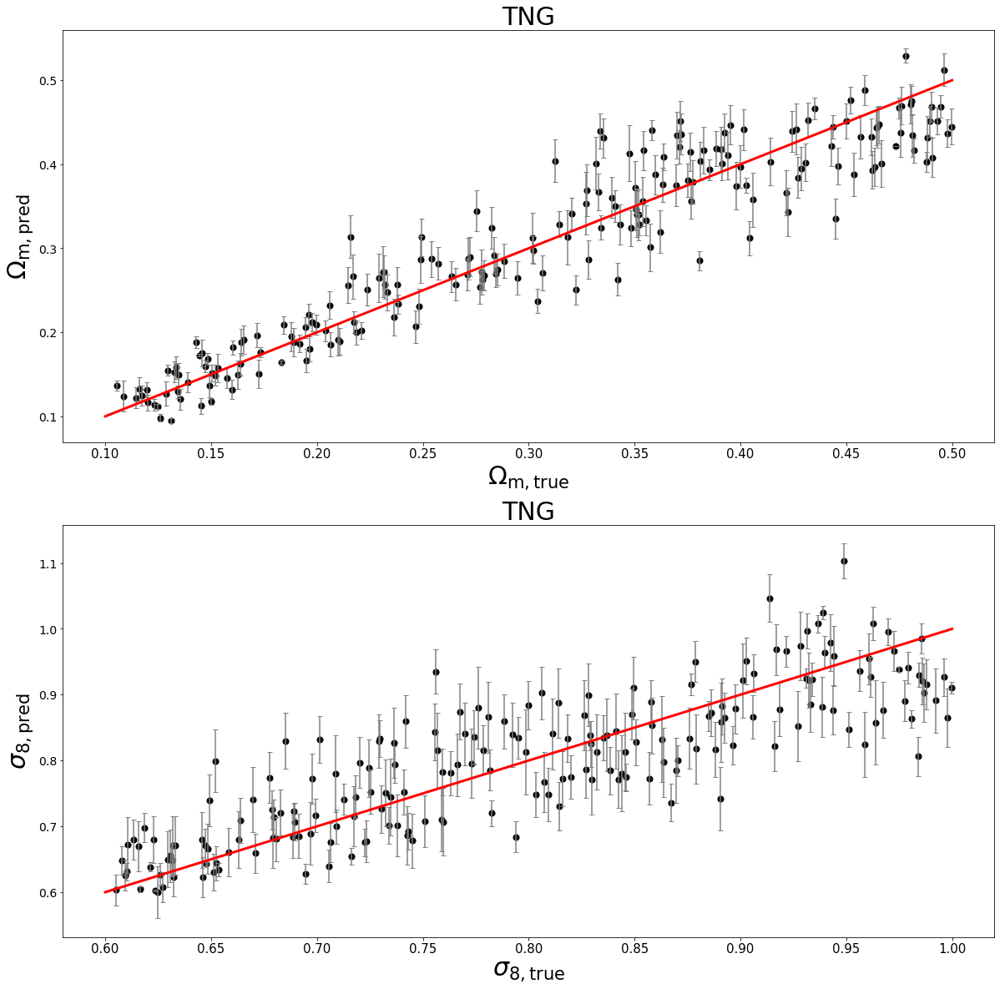

In [21]:
field = 'T';
sim   = 'TNG'
norm = True
mono = True
h    = 1
average=True
fname = "search/{}_{}_mono_{}_norm_{}_h_{}".format(sim, field, int(mono),int(norm),h)
mist = MIST(sim=sim,field=field, normalization=norm, monopole=mono, average=average, projection=False)
mist.load_models(fname=fname, which_machine='vib',z_dim=200, hidden=h, dr=0.5)
mist.make_plots(show_plot=True, data_return=False)
#mist.test_on(sims="ASTRID", fname="0.01", data_return=False,show_plot=True, show_score=False, save_plot=False)

In [13]:
field = 'T';
sim   = 'TNG'
norm = True
mono = True
h    = 1
average=False
fname = "search/{}_{}_mono_{}_norm_{}_h_{}_nav".format(sim, field, int(mono),int(norm),h)
mist = MIST(sim=sim,field=field, extended_L=False, normalization=norm, monopole=mono, average=False)
mist.load_models(fname=fname, which_machine='vib',z_dim=200, hidden=h, dr=0.5)
mist.make_plots(show_plot=True, data_return=False)
#mist.test_on(sims="ASTRID", fname="0.01", data_return=False,show_plot=True, show_score=False, save_plot=False)

RuntimeError: PytorchStreamReader failed reading zip archive: failed finding central directory

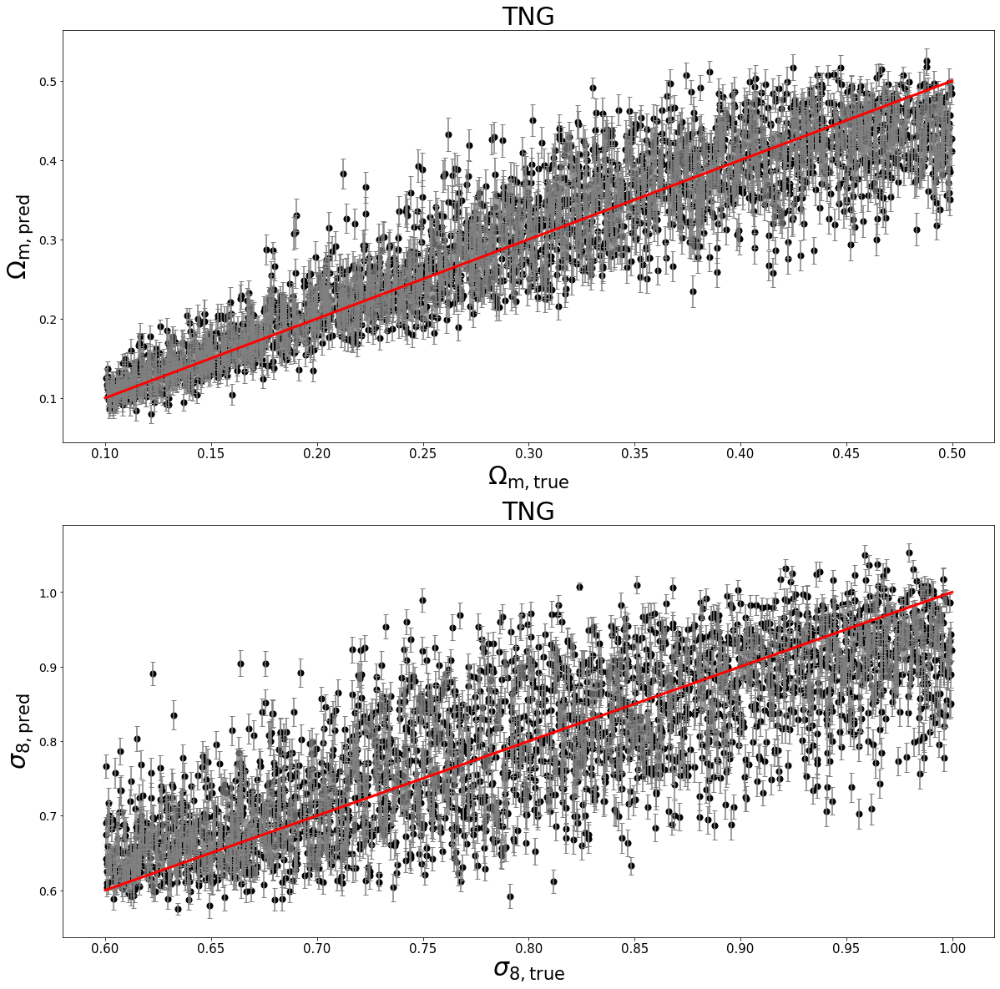

In [7]:
field = 'HI';
sim   = 'TNG'
norm = True
mono = True
h    = 1
average=False
fname = "search/{}_{}_mono_{}_norm_{}_h_{}_no_avg".format(sim, field, int(mono),int(norm),h)
mist = MIST(sim=sim,field=field, extended_L=False, normalization=norm, monopole=mono, average=False)
mist.load_models(fname=fname, which_machine='vib',z_dim=200, hidden=h, dr=0.5)
mist.make_plots(show_plot=True, data_return=False)
#mist.test_on(sims="ASTRID", fname="0.01", data_return=False,show_plot=True, show_score=False, save_plot=False)

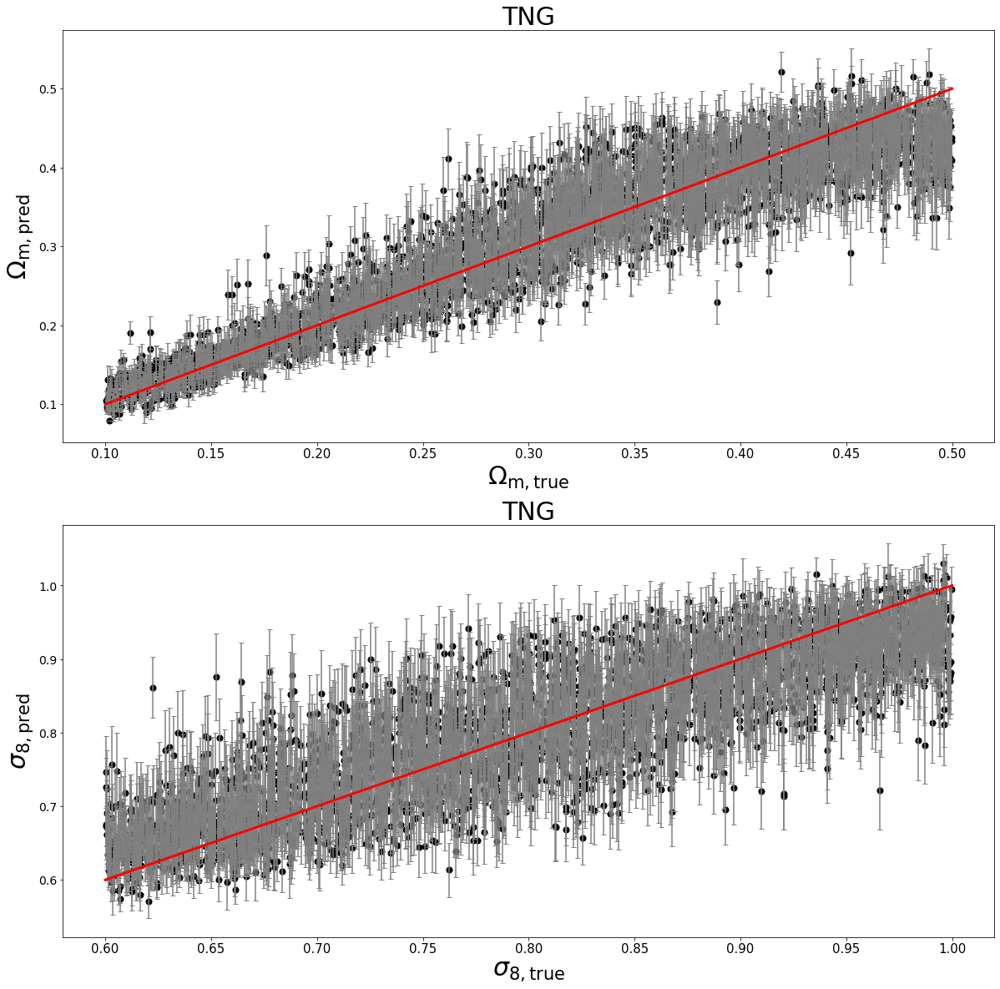

In [22]:
field = 'HI';
sim   = 'TNG'
norm = False
mono = False
h    = 1
average=False
fname = "search/{}_{}_mono_{}_norm_{}_h_{}_no_avg".format(sim, field, int(mono),int(norm),h)
mist = MIST(sim=sim,field=field, extended_L=False, normalization=norm, monopole=mono, average=average)
mist.load_models(fname=fname, which_machine='vib',z_dim=200, hidden=h, dr=0.5)
mist.make_plots(show_plot=True, data_return=False)
#mist.test_on(sims="ASTRID", fname="0.01", data_return=False,show_plot=True, show_score=False, save_plot=False)

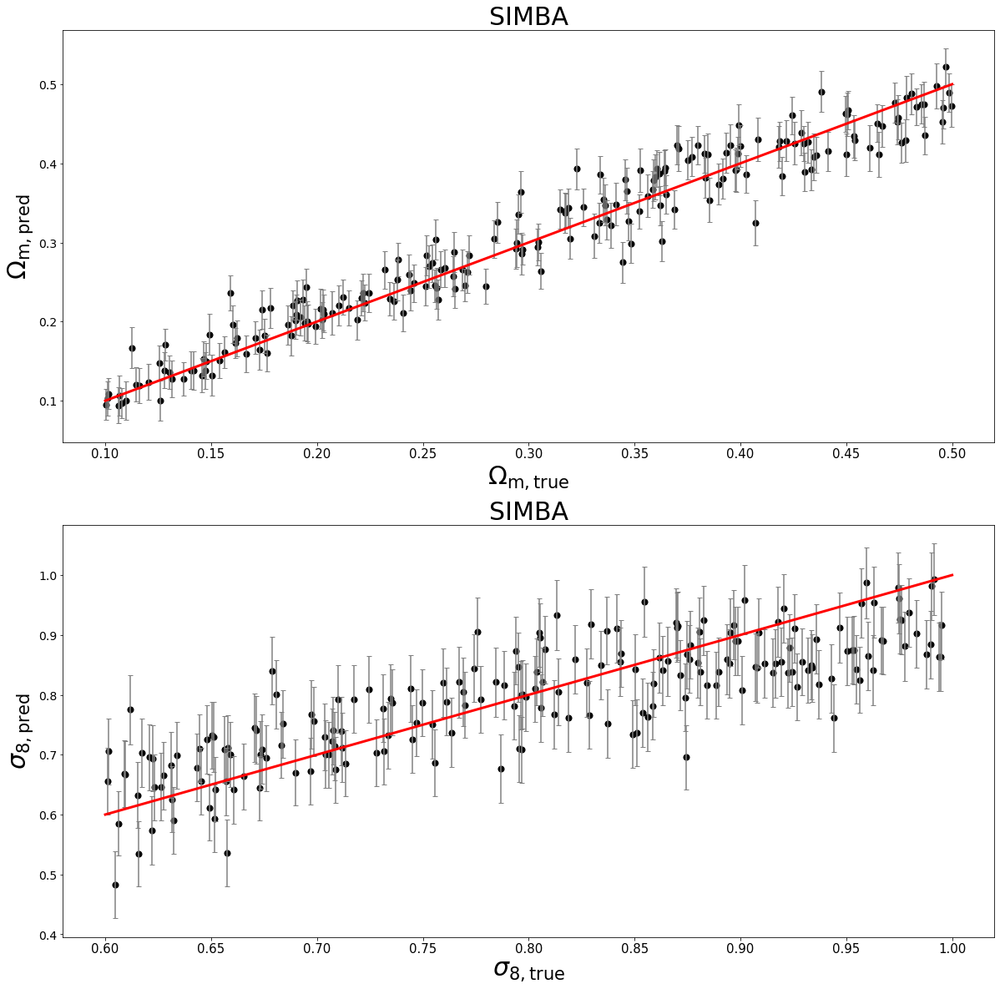

In [20]:
field = 'HI';
sim   = 'SIMBA'
norm = True
mono = False
h    = 1
average=True
fname = "search/{}_{}_mono_{}_norm_{}_h_{}".format(sim, field, int(mono),int(norm),h)
mist = MIST(sim=sim,field=field, extended_L=False, normalization=norm, monopole=mono, average=average)
mist.load_models(fname=fname, which_machine='vib',z_dim=200, hidden=h, dr=0.5)
mist.make_plots(show_plot=True, data_return=False)
#mist.test_on(sims="ASTRID", fname="0.01", data_return=False,show_plot=True, show_score=False, save_plot=False)

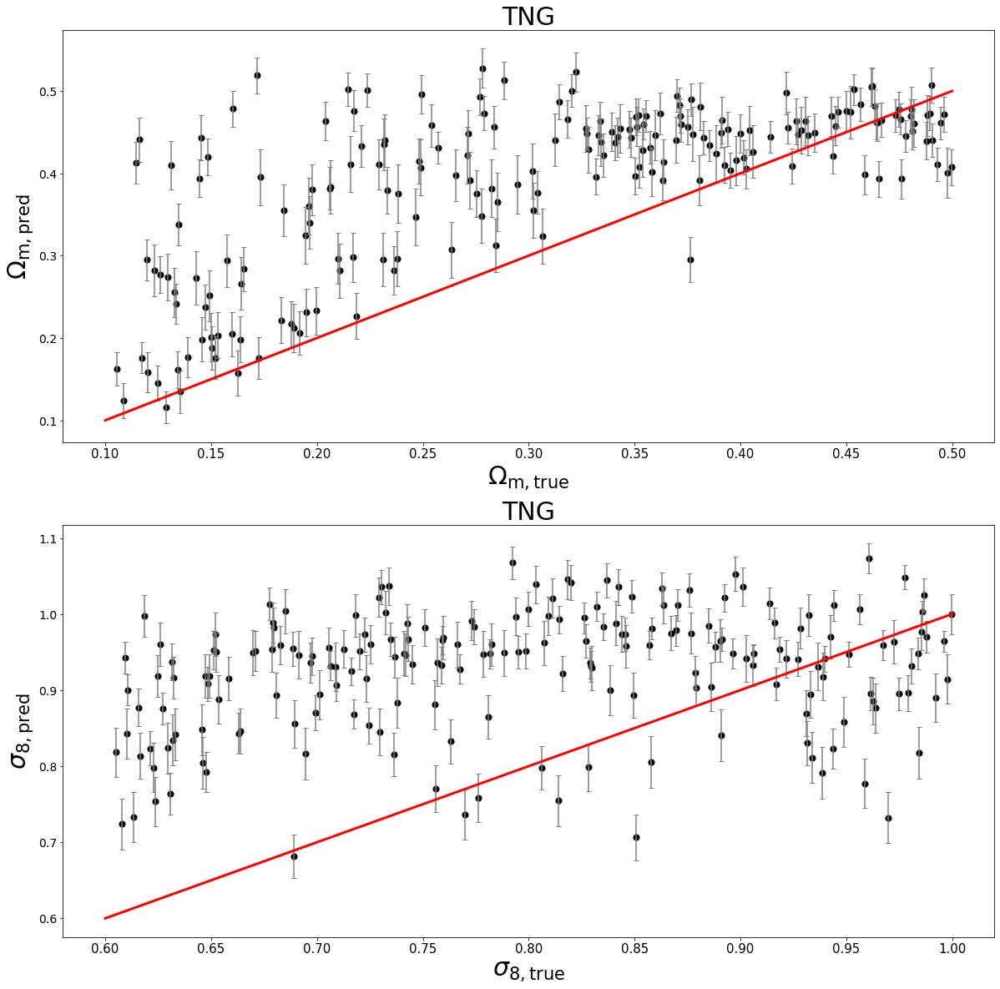

In [17]:
field = 'T';
sim   = 'TNG'
norm = True
mono = False
h    = 1
average=True
fname = "search/{}_{}_mono_{}_norm_{}_h_{}_no_avg".format(sim, field, int(mono),int(norm),h)
mist = MIST(sim=sim,field=field, extended_L=False, normalization=norm, monopole=mono, average=average)
mist.load_models(fname=fname, which_machine='vib',z_dim=200, hidden=h, dr=0.5)
mist.make_plots(show_plot=True, data_return=False)
#mist.test_on(sims="ASTRID", fname="0.01", data_return=False,show_plot=True, show_score=False, save_plot=False)

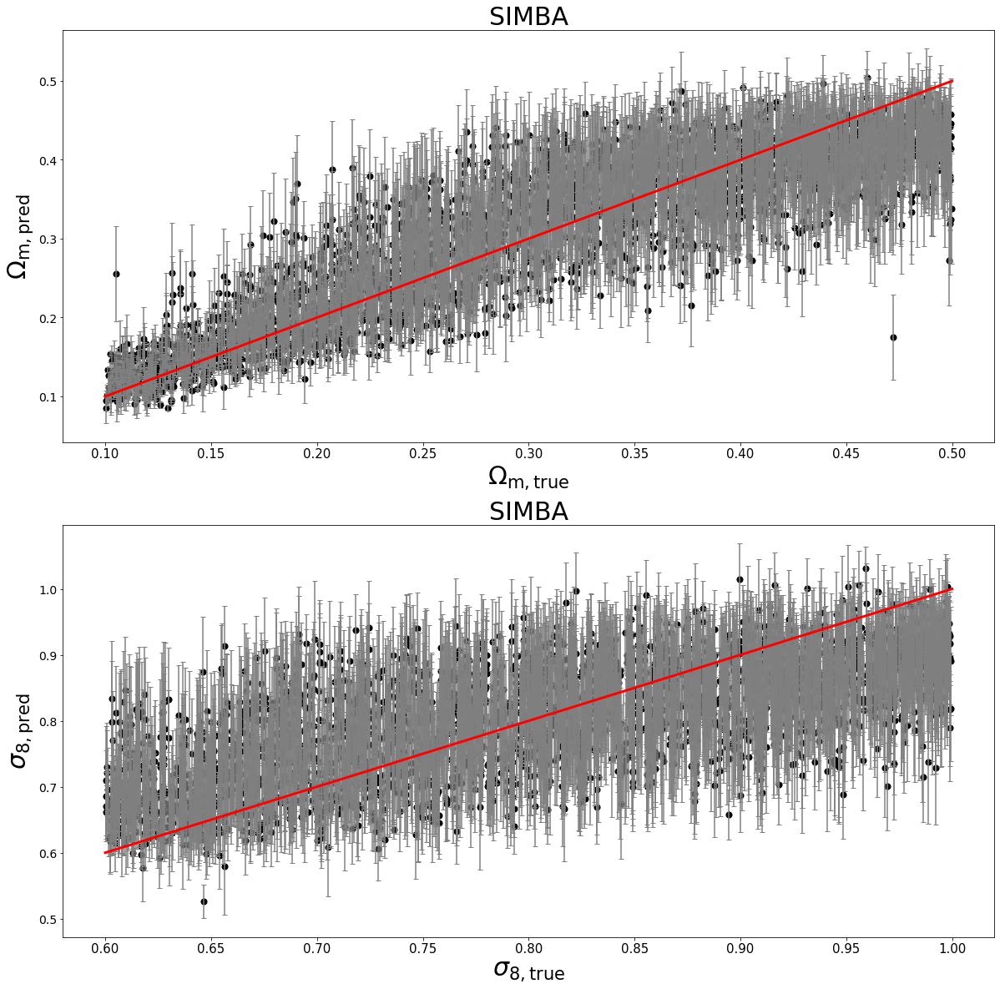

In [13]:
field = 'T';
sim   = 'SIMBA'
norm = False
mono = True
h    = 1
average=False
fname = "search/{}_{}_mono_{}_norm_{}_h_{}_no_avg".format(sim, field, int(mono),int(norm),h)
mist = MIST(sim=sim,field=field, extended_L=False, normalization=norm, monopole=mono, average=average)
mist.load_models(fname=fname, which_machine='vib',z_dim=200, hidden=h, dr=0.5)
mist.make_plots(show_plot=True, data_return=False)
#mist.test_on(sims="ASTRID", fname="0.01", data_return=False,show_plot=True, show_score=False, save_plot=False)

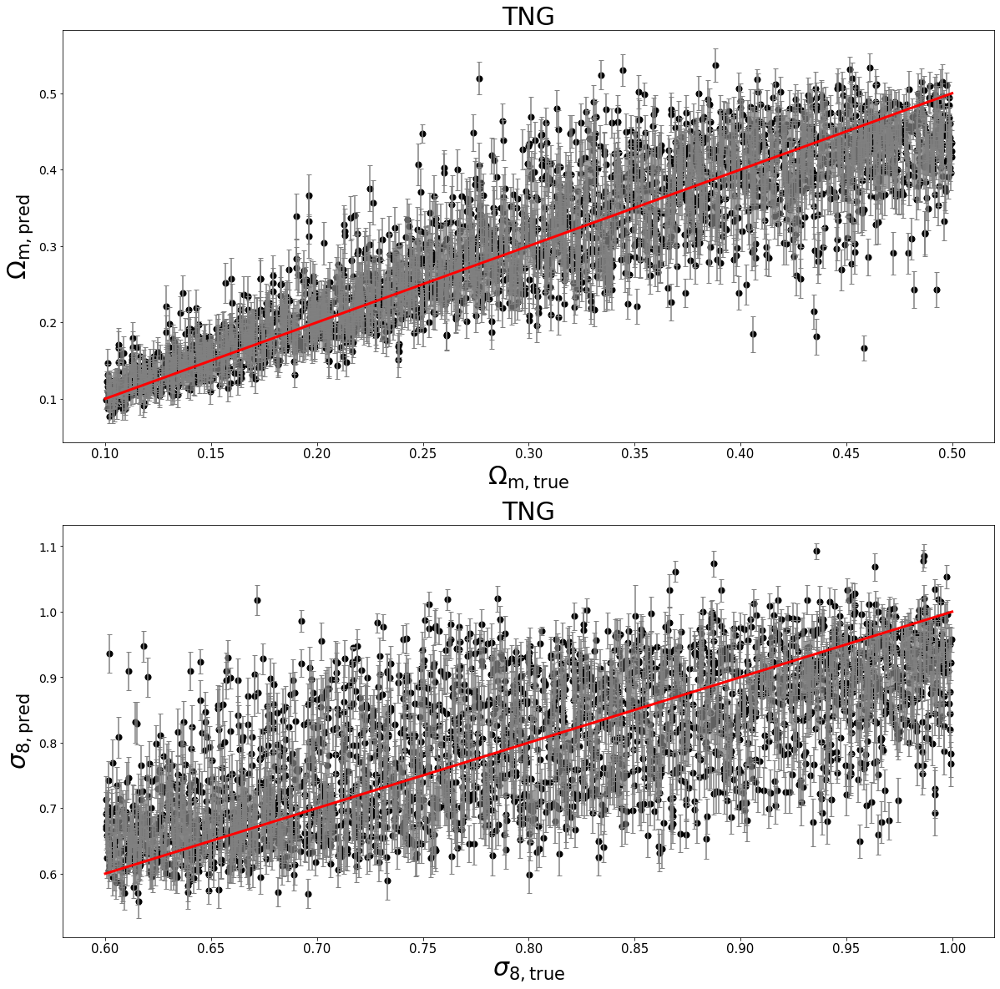

In [10]:
field = 'T';
sim   = 'TNG'
norm = True
mono = True
h    = 1
average=False
fname = "search/{}_{}_mono_{}_norm_{}_h_{}_no_avg".format(sim, field, int(mono),int(norm),h)
mist = MIST(sim=sim,field=field, extended_L=False, normalization=norm, monopole=mono, average=False)
mist.load_models(fname=fname, which_machine='vib',z_dim=200, hidden=h, dr=0.5)
mist.make_plots(show_plot=True, data_return=False)
#mist.test_on(sims="ASTRID", fname="0.01", data_return=False,show_plot=True, show_score=False, save_plot=False)

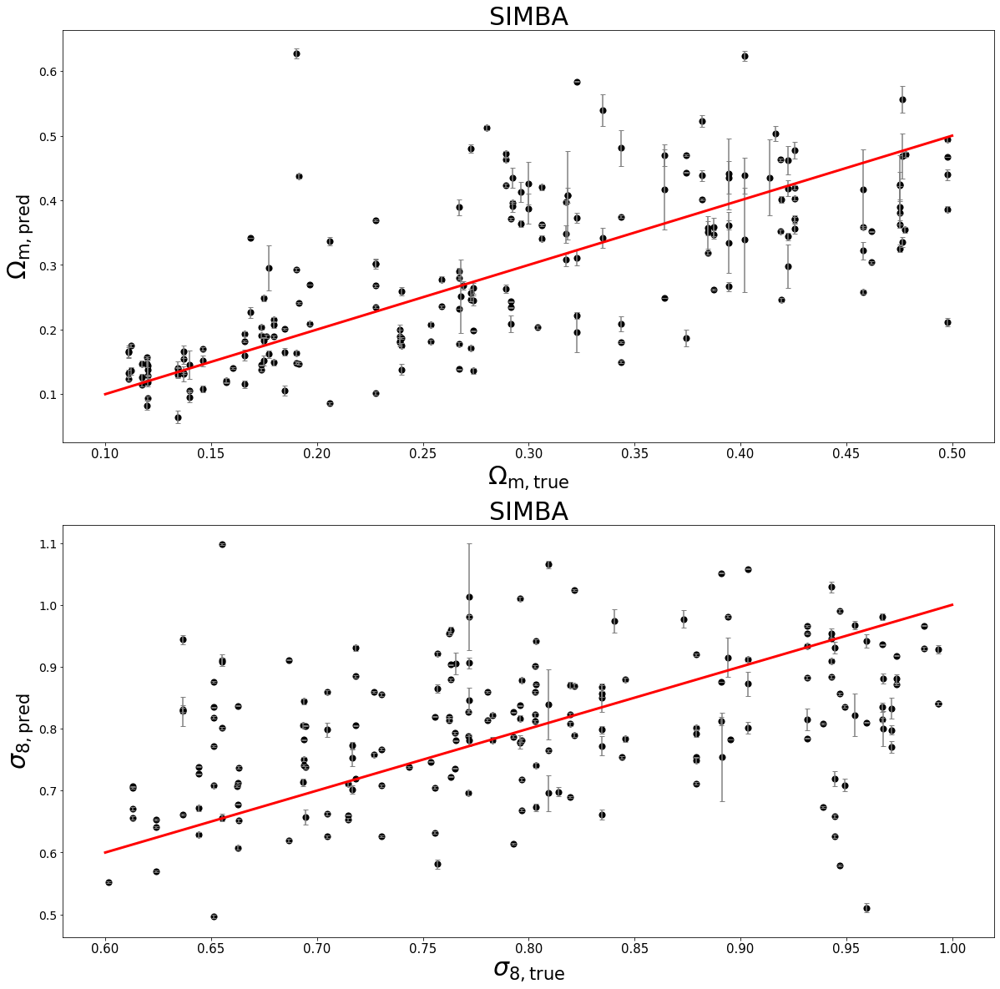

In [10]:
field = 'T';
sim   = 'SIMBA'
norm = True
mono = True
h    = 1
average=False
fname = "search/{}_{}_mono_{}_norm_{}_h_{}_no_avg".format(sim, field, int(mono),int(norm),h)
mist = MIST(sim=sim,field=field, extended_L=False, normalization=norm, monopole=mono, average=False)
mist.load_models(fname=fname, which_machine='vib',z_dim=200, hidden=h, dr=0.5)
mist.make_plots(show_plot=True, data_return=False)
#mist.test_on(sims="ASTRID", fname="0.01", data_return=False,show_plot=True, show_score=False, save_plot=False)

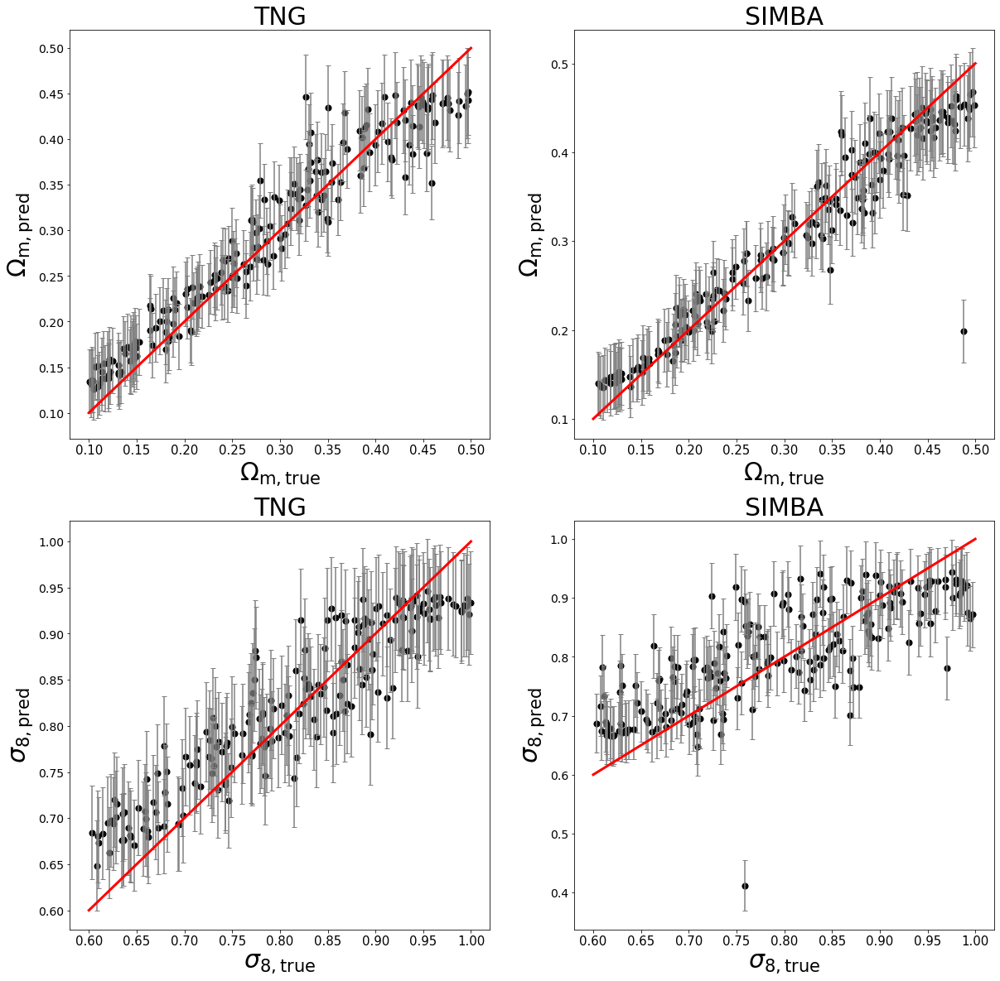

In [25]:
field = 'HI';
norm = True
mono = True
h    = 0.5
fname = "search/TNG+SIMBA_T_mono_{}_norm_{}_h_{}".format(int(mono),int(norm),h)
mist = MIST(sim=["TNG","SIMBA"],field=field, extended_L=False, normalization=norm, monopole=mono)
mist.load_models(fname=fname, which_machine='vib+cls_a',z_dim=200, hidden=h, dr=0.5)
mist.make_plots(show_plot=True, data_return=False)
#mist.test_on(sims="ASTRID", fname="0.01", data_return=False,show_plot=True, show_score=False, save_plot=False)

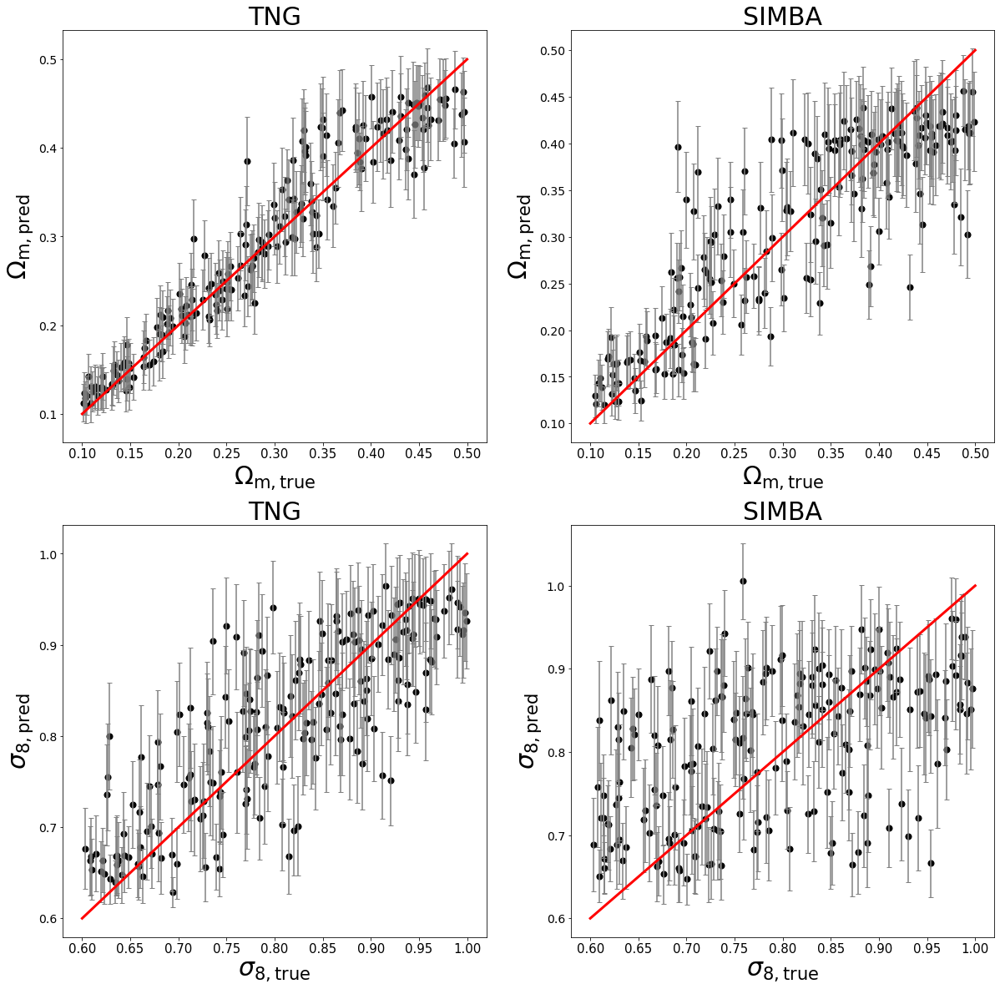

In [21]:
field = 'T';
norm = True
mono = True
h    = 1
fname = "search/TNG+SIMBA_{}_mono_{}_norm_{}_h_{}_L_10_dn_2_z_1000_j1".format(field,int(mono),int(norm),h)
mist = MIST(sim=["TNG","SIMBA"],field=field, extended_L=10, extended_dn=False, normalization=norm, monopole=mono)
mist.load_models(fname=fname, which_machine='vib+cls_a',z_dim=1000, hidden=h, dr=0.5)
mist.make_plots(show_plot=True, data_return=False)
#mist.test_on(sims="ASTRID", fname="0.01", data_return=False,show_plot=True, show_score=False, save_plot=False)

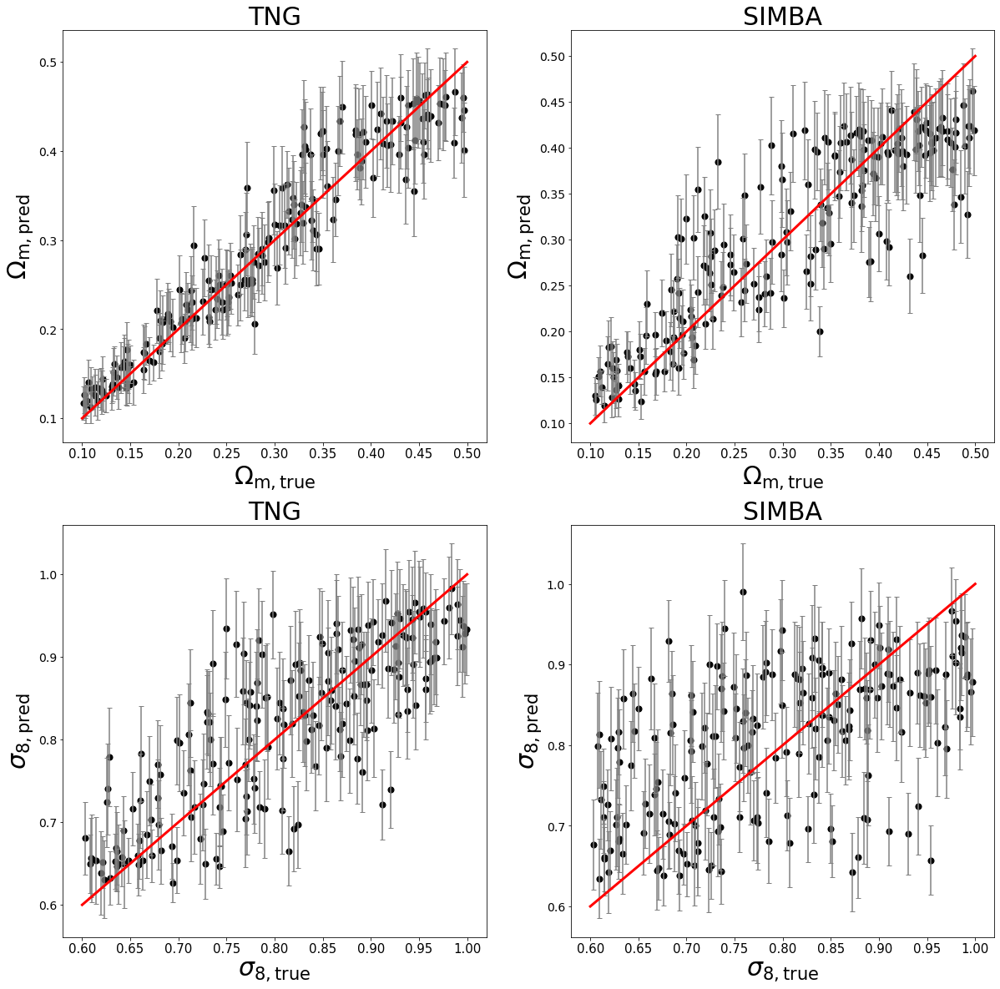

In [20]:
field = 'T';
norm = True
mono = True
h    = 1
fname = "search/TNG+SIMBA_{}_mono_{}_norm_{}_h_{}_L_10_dn_2_z_1000".format(field,int(mono),int(norm),h)
mist = MIST(sim=["TNG","SIMBA"],field=field, extended_L=10, extended_dn=False, normalization=norm, monopole=mono)
mist.load_models(fname=fname, which_machine='vib+cls_a',z_dim=1000, hidden=h, dr=0.5)
mist.make_plots(show_plot=True, data_return=False)
#mist.test_on(sims="ASTRID", fname="0.01", data_return=False,show_plot=True, show_score=False, save_plot=False)

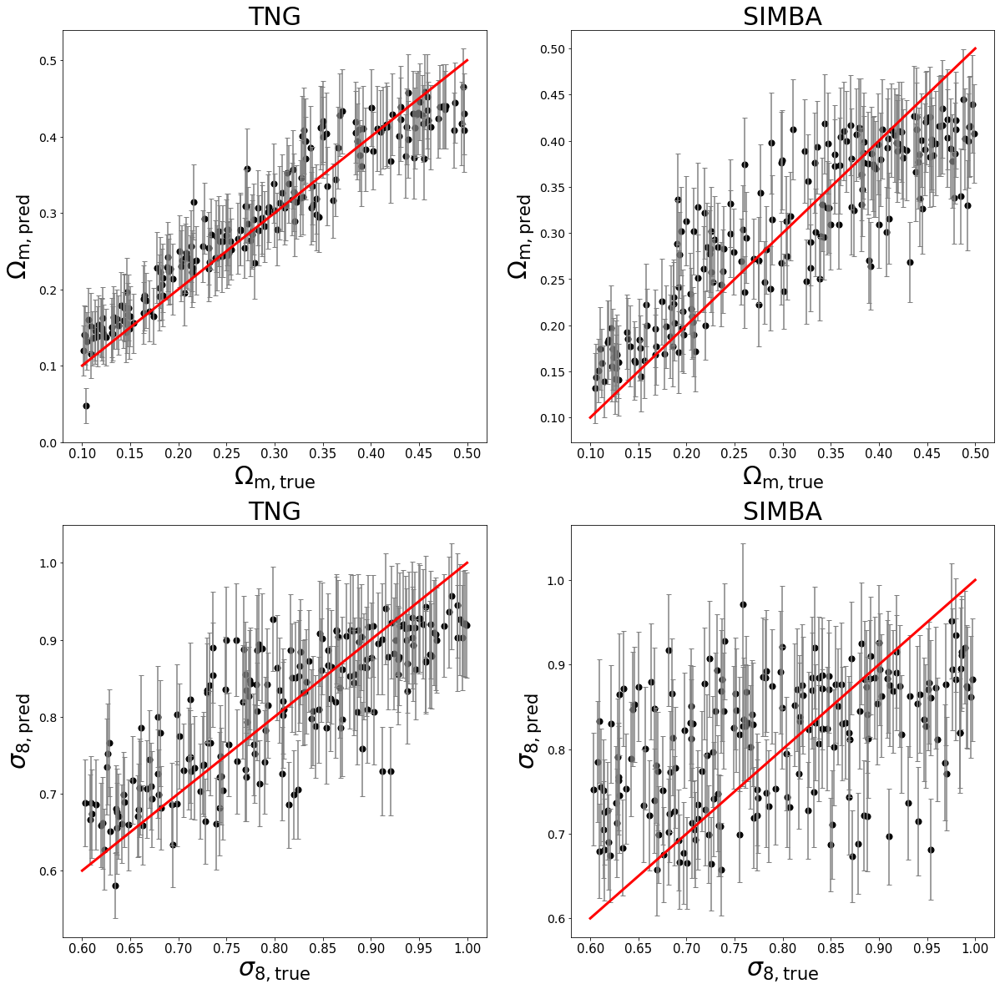

In [8]:
field = 'T';
norm = True
mono = True
h    = 1
fname = "search/TNG+SIMBA_{}_mono_{}_norm_{}_h_{}_L_10".format(field,int(mono),int(norm),h)
mist = MIST(sim=["TNG","SIMBA"],field=field, extended_L=10, extended_dn=False, normalization=norm, monopole=mono)
mist.load_models(fname=fname, which_machine='vib+cls_a',z_dim=200, hidden=h, dr=0.5)
mist.make_plots(show_plot=True, data_return=False)
#mist.test_on(sims="ASTRID", fname="0.01", data_return=False,show_plot=True, show_score=False, save_plot=False)

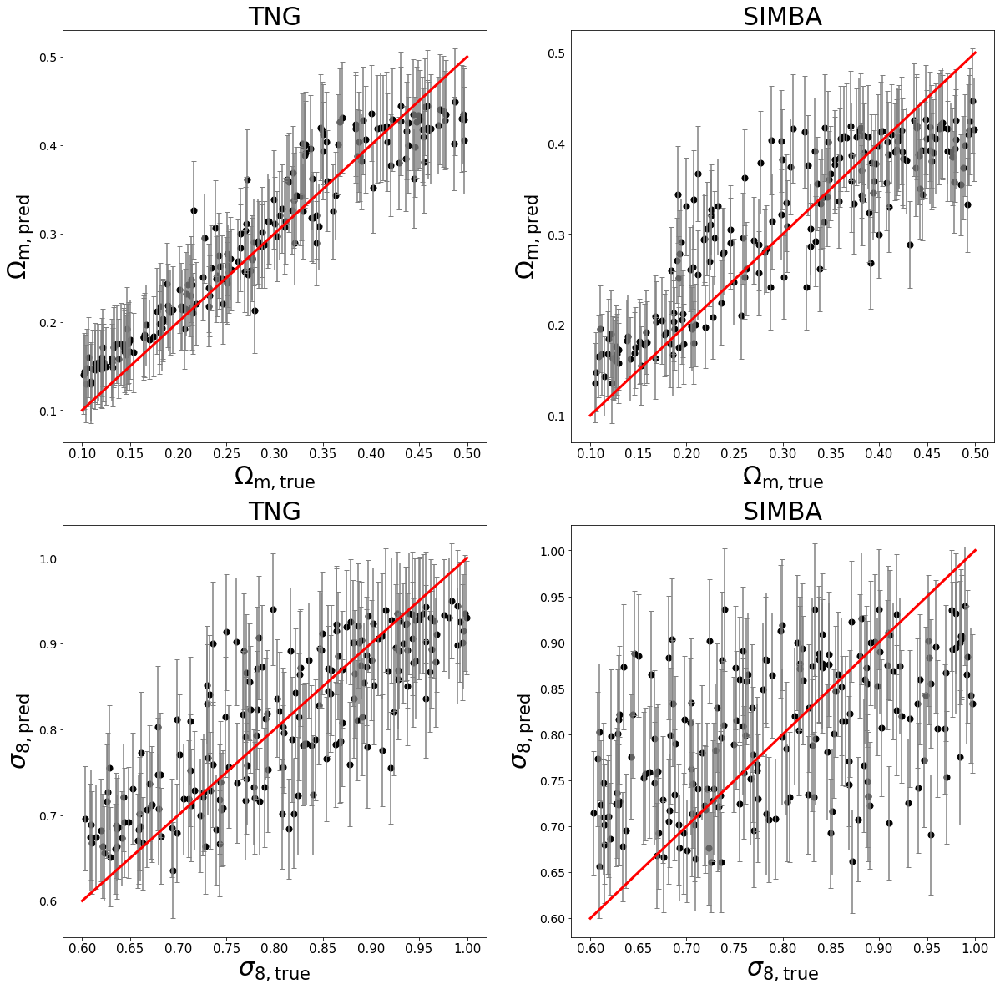

In [10]:
field = 'T';
norm = True
mono = True
h    = 1
fname = "search/TNG+SIMBA_{}_mono_{}_norm_{}_h_{}_L_10_dn_2".format(field,int(mono),int(norm),h)
mist = MIST(sim=["TNG","SIMBA"],field=field, extended_L=10, extended_dn=2, normalization=norm, monopole=mono)
mist.load_models(fname=fname, which_machine='vib+cls_a',z_dim=200, hidden=h, dr=0.5)
mist.make_plots(show_plot=True, data_return=False)
#mist.test_on(sims="ASTRID", fname="0.01", data_return=False,show_plot=True, show_score=False, save_plot=False)

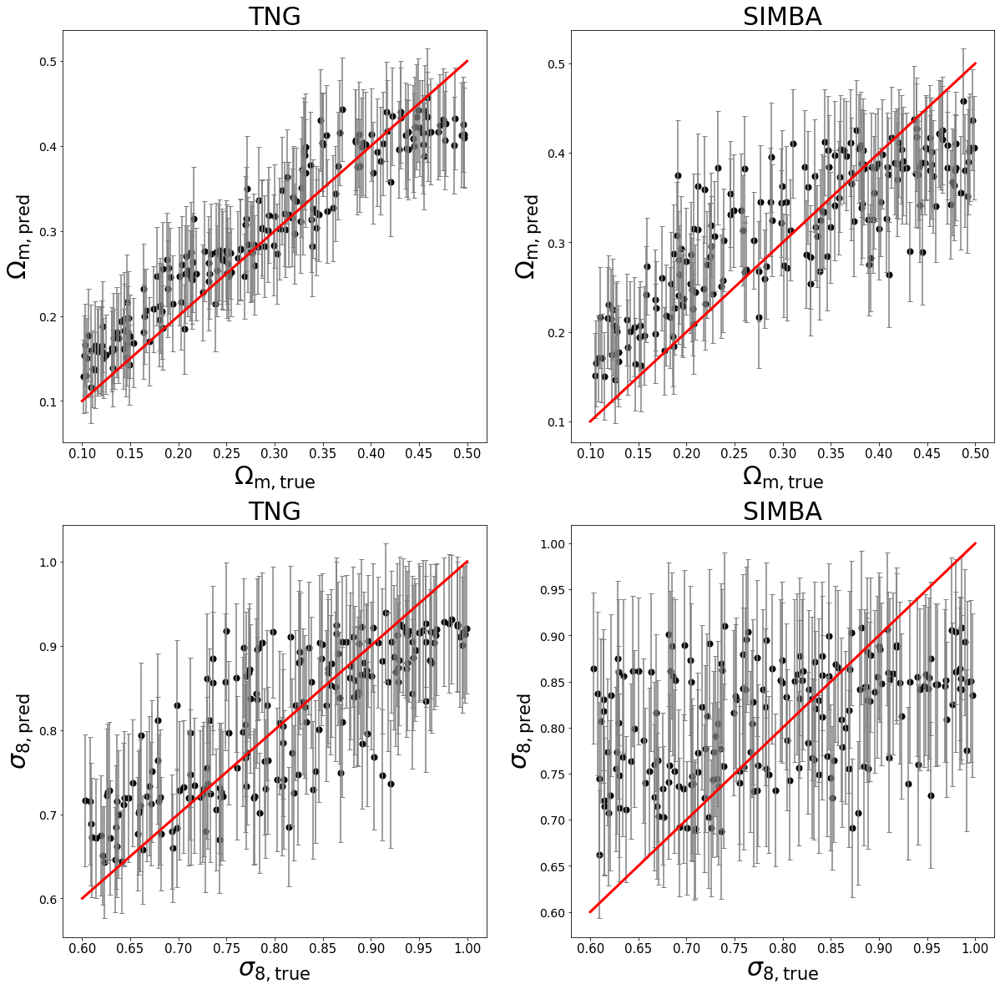

In [9]:
field = 'T';
norm = True
mono = True
h    = 0.5
fname = "search/TNG+SIMBA_{}_mono_{}_norm_{}_h_{}".format(field,int(mono),int(norm),h)
mist = MIST(sim=["TNG","SIMBA"],field=field, extended_L=False, normalization=norm, monopole=mono)
mist.load_models(fname=fname, which_machine='vib+cls_a',z_dim=200, hidden=h, dr=0.5)
mist.make_plots(show_plot=True, data_return=False)
#mist.test_on(sims="ASTRID", fname="0.01", data_return=False,show_plot=True, show_score=False, save_plot=False)

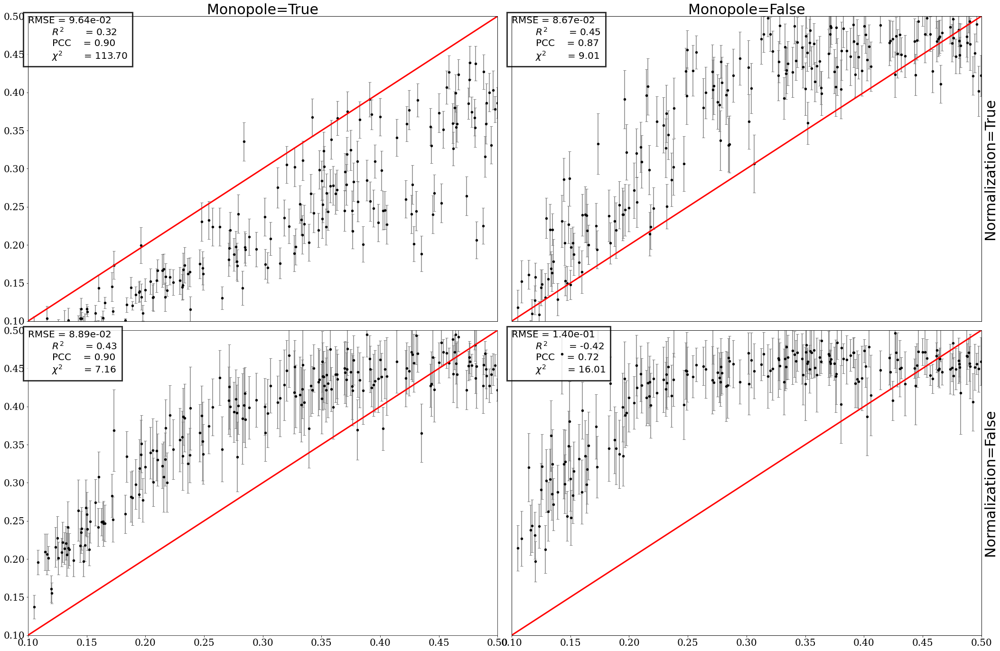

In [13]:
field = 'T';

fig_shape = (2,2)
axes = generateAxesForMultiplePlots(shape=fig_shape,figsize=(36,24),wspace=0.03,hspace=0.03)
plt.rcParams["font.family"] = "serif"
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
fontsize = 30
ideal1 = np.linspace(0.1,0.5,3)
ideal2 = np.linspace(0.2,1.2,3)


monos = [True, False]
norms = [True, False]
hs    = [0.5, 1, 2]
l=0
for i in range(2):
    for j in range(2):
        mono, norm, h = monos[i], norms[j], hs[1]
        fname = "search/TNG_{}_mono_{}_norm_{}_h_{}".format(field,int(mono),int(norm),h)
        mist = MIST(sim="TNG",field=field, extended_L=False,
                    normalization=norm, monopole=mono)
        mist.load_models(fname=fname, which_machine='vib',z_dim=200, hidden=h, dr=0.5)
        y_true, y_pred = mist.make_plots(show_plot=False, data_return=True)
        axes[i,j].errorbar(y_true[l][:,0], y_pred[l][0][:,0], y_pred[l][1][:,0],linestyle="None",ecolor="grey",
                         capsize=3,zorder=0)
        axes[i,j].scatter(y_true[l][:,0], y_pred[l][0][:,0],s=20,c='k', zorder=10)
        RMSE = np.sqrt(mean_squared_error(y_true[l][:,0], y_pred[l][0][:,0]))
        R2   = r2_score(y_true[l][:,0], y_pred[l][0][:,0])
        PCC  = pearsonr(y_true[l][:,0], y_pred[l][0][:,0])[0]
        CHI2 = np.mean((y_true[l][:,0]-y_pred[l][0][:,0])**2/y_pred[l][1][:,0]**2)
        text = \
        r"""{:<5}= {:.2e}
        {:<12}= {:.2f}
        {:<7}= {:.2f}
        {:<15}= {:.2f}""".format("RMSE", RMSE,"$R^2$", R2,
                            "PCC", PCC, "$\chi^2$", CHI2)
        axes[i,j].text(0.1, 0.5, text, fontsize=20,
                       ha='left', va='top',bbox=dict(facecolor='white', alpha=0.8,pad=10,
                                                    edgecolor='black', linewidth=3))
        
        axes[i,j].plot(ideal1,ideal1,"r",lw=3,zorder=12)
        remove_inner_axes(axes,fig_shape)
        axes[i,j].set_xlim(0.1,0.5)
        axes[i,j].set_ylim(0.1,0.5)
        if j == 0:
            ax = axes[i,j].twiny()
            ax.xaxis.tick_top()
            ax.set_xticks([])
            ax.set_xlabel(r"Monopole={}".format(mono),fontsize=fontsize)
        if i == 1:
            ax = axes[i,j].twinx()
            ax.yaxis.tick_right()
            ax.set_yticks([])
            ax.set_ylabel(r"Normalization={}".format(norm),fontsize=fontsize)
#axes[0,3].set_xlabel("$\Omega_\mathrm{m, true}$", fontsize=fontsize)
#axes[0,3].set_ylabel("$\Omega_\mathrm{m, pred}$", fontsize=fontsize)
#plt.savefig("Exploration_HI_omegam_TNG.png", dpi=200, bbox_inches='tight')

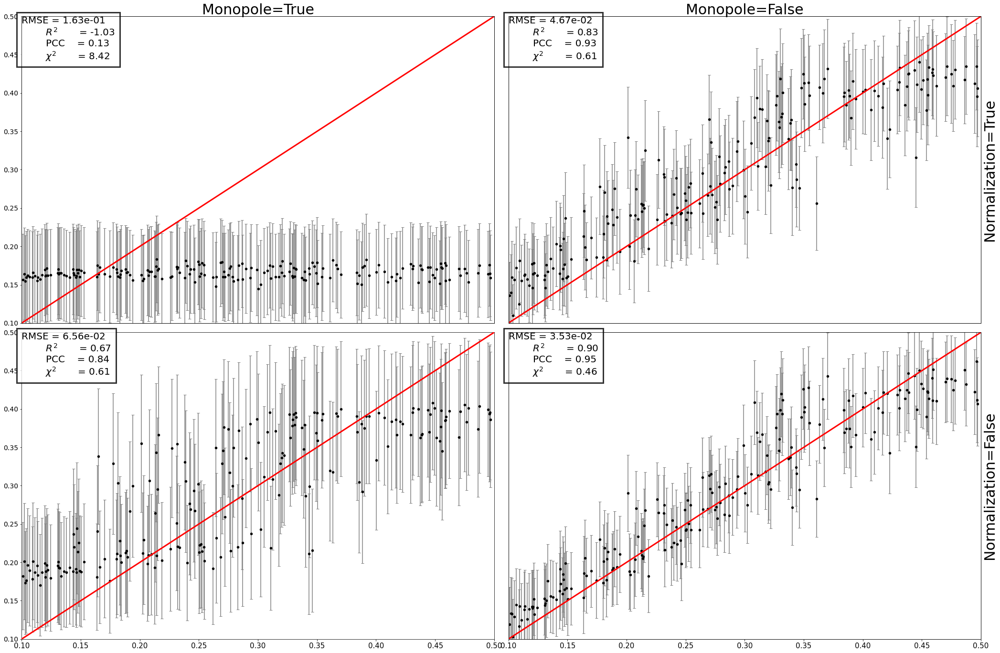

In [16]:
field = 'T';

fig_shape = (2,2)
axes = generateAxesForMultiplePlots(shape=fig_shape,figsize=(36,24),wspace=0.03,hspace=0.03)
plt.rcParams["font.family"] = "serif"
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
fontsize = 30
ideal1 = np.linspace(0.1,0.5,3)
ideal2 = np.linspace(0.2,1.2,3)


monos = [True, False]
norms = [True, False]
hs    = [0.5, 1, 2]
l=0
for i in range(2):
    for j in range(2):
        mono, norm, h = monos[i], norms[j], hs[1]
        fname = "search/TNG+SIMBA_{}_mono_{}_norm_{}_h_{}".format(field,int(mono),int(norm),h)
        mist = MIST(sim=["TNG","SIMBA"],field=field, extended_L=False,
                    normalization=norm, monopole=mono)
        mist.load_models(fname=fname, which_machine='vib+cls_a',z_dim=200, hidden=h, dr=0.5)
        y_true, y_pred = mist.make_plots(show_plot=False, data_return=True)
        axes[i,j].errorbar(y_true[l][:,0], y_pred[l][0][:,0], y_pred[l][1][:,0],linestyle="None",ecolor="grey",
                         capsize=3,zorder=0)
        axes[i,j].scatter(y_true[l][:,0], y_pred[l][0][:,0],s=20,c='k', zorder=10)
        RMSE = np.sqrt(mean_squared_error(y_true[l][:,0], y_pred[l][0][:,0]))
        R2   = r2_score(y_true[l][:,0], y_pred[l][0][:,0])
        PCC  = pearsonr(y_true[l][:,0], y_pred[l][0][:,0])[0]
        CHI2 = np.mean((y_true[l][:,0]-y_pred[l][0][:,0])**2/y_pred[l][1][:,0]**2)
        text = \
        r"""{:<5}= {:.2e}
        {:<12}= {:.2f}
        {:<7}= {:.2f}
        {:<15}= {:.2f}""".format("RMSE", RMSE,"$R^2$", R2,
                            "PCC", PCC, "$\chi^2$", CHI2)
        axes[i,j].text(0.1, 0.5, text, fontsize=20,
                       ha='left', va='top',bbox=dict(facecolor='white', alpha=0.8,pad=10,
                                                    edgecolor='black', linewidth=3))
        
        axes[i,j].plot(ideal1,ideal1,"r",lw=3,zorder=12)
        remove_inner_axes(axes,fig_shape)
        axes[i,j].set_xlim(0.1,0.5)
        axes[i,j].set_ylim(0.1,0.5)
        if j == 0:
            ax = axes[i,j].twiny()
            ax.xaxis.tick_top()
            ax.set_xticks([])
            ax.set_xlabel(r"Monopole={}".format(mono),fontsize=fontsize)
        if i == 1:
            ax = axes[i,j].twinx()
            ax.yaxis.tick_right()
            ax.set_yticks([])
            ax.set_ylabel(r"Normalization={}".format(norm),fontsize=fontsize)
#axes[0,3].set_xlabel("$\Omega_\mathrm{m, true}$", fontsize=fontsize)
#axes[0,3].set_ylabel("$\Omega_\mathrm{m, pred}$", fontsize=fontsize)
#plt.savefig("Exploration_HI_omegam_TNG.png", dpi=200, bbox_inches='tight')

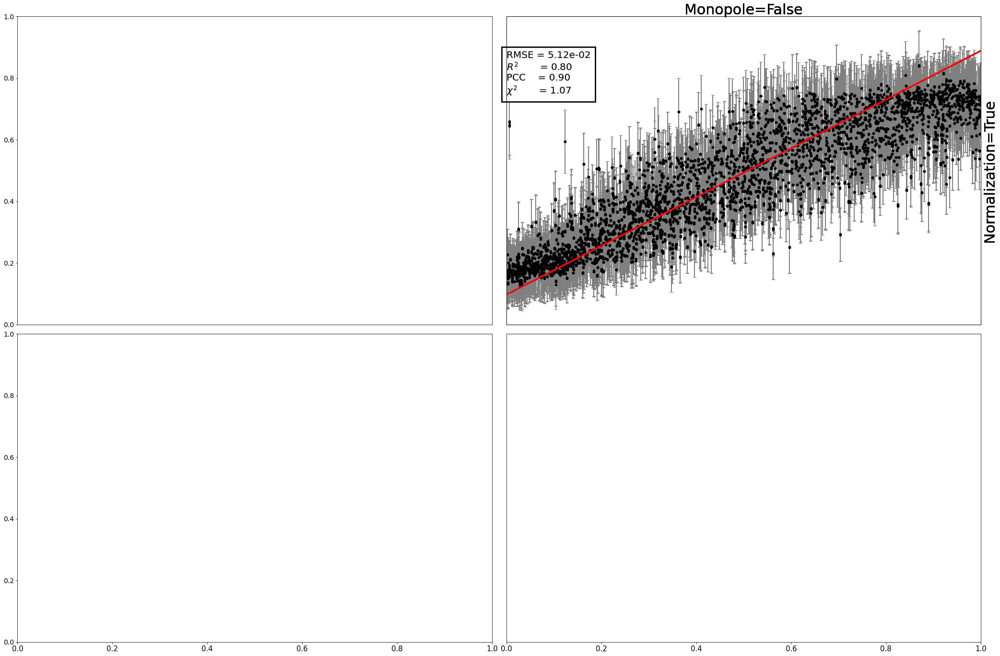

In [23]:
field = 'HI';

fig_shape = (2,2)
axes = generateAxesForMultiplePlots(shape=fig_shape,figsize=(36,24),wspace=0.03,hspace=0.03)
plt.rcParams["font.family"] = "serif"
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
fontsize = 30
ideal1 = np.linspace(0.1,0.5,3)
ideal2 = np.linspace(0.2,1.2,3)


monos = [True, False]
norms = [True, False]
hs    = [0.5, 1, 2]
average = False
l=1
for i in range(2):
    for j in range(2):
        i=1;j=0;
        mono, norm, h = monos[i], norms[j], hs[0]
        fname = "search/TNG+SIMBA_{}_mono_{}_norm_{}_h_{}_no_avg".format(field,int(mono),int(norm),h)
        mist = MIST(sim=["TNG","SIMBA"],field=field, extended_L=False,
                    normalization=norm, monopole=mono, average=average)
        mist.load_models(fname=fname, which_machine='vib+cls_a',z_dim=200, hidden=h, dr=0.5)
        y_true, y_pred = mist.make_plots(show_plot=False, data_return=True)
        y_true = y_true[l][:,0]
        y_mean = y_pred[l][0][:,0]
        y_std  = y_pred[l][1][:,0]
        
        axes[i,j].errorbar(y_true, y_mean, y_std,linestyle="None",ecolor="grey",
                         capsize=3,zorder=0)
        axes[i,j].scatter(y_true, y_mean,s=20,c='k', zorder=10)
        
        RMSE = np.sqrt(mean_squared_error(y_true, y_mean))
        R2   = r2_score(y_true, y_mean)
        PCC  = pearsonr(y_true, y_mean)[0]
        CHI2 = np.mean((y_true-y_mean)**2/y_std**2)
        text = \
r"""{:<5}= {:.2e}
{:<12}= {:.2f}
{:<7}= {:.2f}
{:<15}= {:.2f}""".format("RMSE", RMSE,"$R^2$", R2,
                            "PCC", PCC, "$\chi^2$", CHI2)
        axes[i,j].text(0.1, 0.5, text, fontsize=20,
                       ha='left', va='top',bbox=dict(facecolor='white', alpha=0.8,pad=10,
                                                    edgecolor='black', linewidth=3))
        
        axes[i,j].plot(ideal1,ideal1,"r",lw=3,zorder=12)
        remove_inner_axes(axes,fig_shape)
        axes[i,j].set_xlim(0.1,0.5)
        #axes[i,j].set_ylim(0.1,0.5)
        if j == 0:
            ax = axes[i,j].twiny()
            ax.xaxis.tick_top()
            ax.set_xticks([])
            ax.set_xlabel(r"Monopole={}".format(mono),fontsize=fontsize)
        if i == 1:
            ax = axes[i,j].twinx()
            ax.yaxis.tick_right()
            ax.set_yticks([])
            ax.set_ylabel(r"Normalization={}".format(norm),fontsize=fontsize)
#axes[0,3].set_xlabel("$\Omega_\mathrm{m, true}$", fontsize=fontsize)
#axes[0,3].set_ylabel("$\Omega_\mathrm{m, pred}$", fontsize=fontsize)
#plt.savefig("Exploration_HI_omegam_TNG.png", dpi=200, bbox_inches='tight')

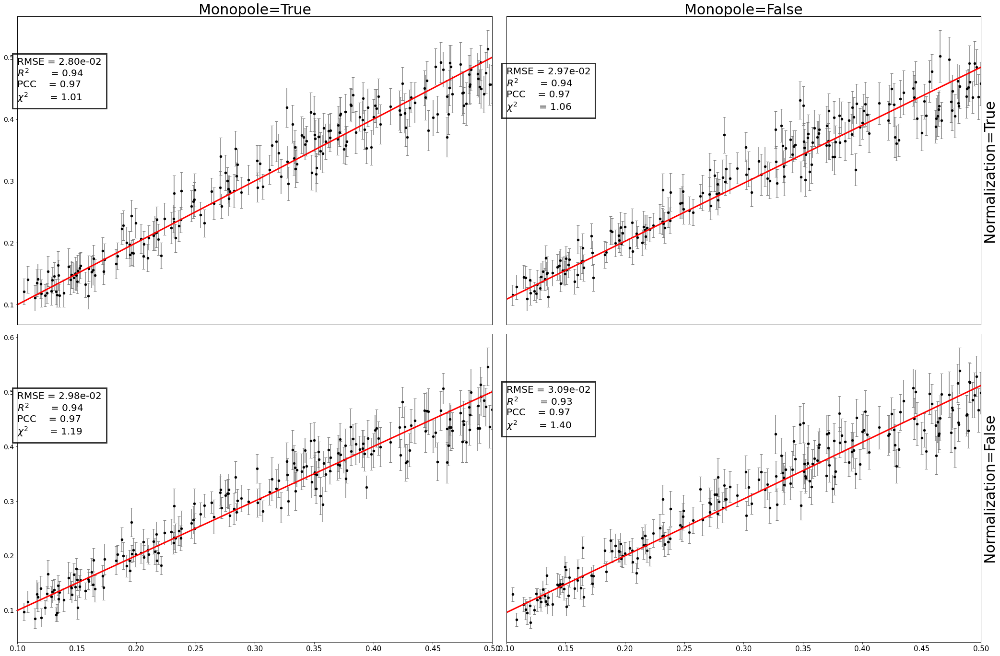

In [30]:
field = 'HI';

fig_shape = (2,2)
axes = generateAxesForMultiplePlots(shape=fig_shape,figsize=(36,24),wspace=0.03,hspace=0.03)
plt.rcParams["font.family"] = "serif"
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
fontsize = 30
ideal1 = np.linspace(0.1,0.5,3)
ideal2 = np.linspace(0.2,1.2,3)


monos = [True, False]
norms = [True, False]
hs    = [0.5, 1, 2]
average = True
sim   = "TNG"
l=0
for i in range(2):
    for j in range(2):
        mono, norm, h = monos[i], norms[j], hs[1]
        fname = "search/{}_{}_mono_{}_norm_{}_h_{}".format(sim, field,int(mono),int(norm),h)
        mist = MIST(sim=sim,field=field, extended_L=False,
                    normalization=norm, monopole=mono, average=average)
        mist.load_models(fname=fname, which_machine='vib',z_dim=200, hidden=h, dr=0.5)
        y_true, y_pred = mist.make_plots(show_plot=False, data_return=True)
        y_true = y_true[l][:,0]
        y_mean = y_pred[l][0][:,0]
        y_std  = y_pred[l][1][:,0]
        
        axes[i,j].errorbar(y_true, y_mean, y_std,linestyle="None",ecolor="grey",
                         capsize=3,zorder=0)
        axes[i,j].scatter(y_true, y_mean,s=20,c='k', zorder=10)
        
        RMSE = np.sqrt(mean_squared_error(y_true, y_mean))
        R2   = r2_score(y_true, y_mean)
        PCC  = pearsonr(y_true, y_mean)[0]
        CHI2 = np.mean((y_true-y_mean)**2/y_std**2)
        text = \
r"""{:<5}= {:.2e}
{:<12}= {:.2f}
{:<7}= {:.2f}
{:<15}= {:.2f}""".format("RMSE", RMSE,"$R^2$", R2,
                            "PCC", PCC, "$\chi^2$", CHI2)
        axes[i,j].text(0.1, 0.5, text, fontsize=20,
                       ha='left', va='top',bbox=dict(facecolor='white', alpha=0.8,pad=10,
                                                    edgecolor='black', linewidth=3))
        
        axes[i,j].plot(ideal1,ideal1,"r",lw=3,zorder=12)
        remove_inner_axes(axes,fig_shape)
        axes[i,j].set_xlim(0.1,0.5)
        #axes[i,j].set_ylim(0.1,0.5)
        if j == 0:
            ax = axes[i,j].twiny()
            ax.xaxis.tick_top()
            ax.set_xticks([])
            ax.set_xlabel(r"Monopole={}".format(mono),fontsize=fontsize)
        if i == 1:
            ax = axes[i,j].twinx()
            ax.yaxis.tick_right()
            ax.set_yticks([])
            ax.set_ylabel(r"Normalization={}".format(norm),fontsize=fontsize)
#axes[0,3].set_xlabel("$\Omega_\mathrm{m, true}$", fontsize=fontsize)
#axes[0,3].set_ylabel("$\Omega_\mathrm{m, pred}$", fontsize=fontsize)
#plt.savefig("Exploration_HI_omegam_TNG.png", dpi=200, bbox_inches='tight')

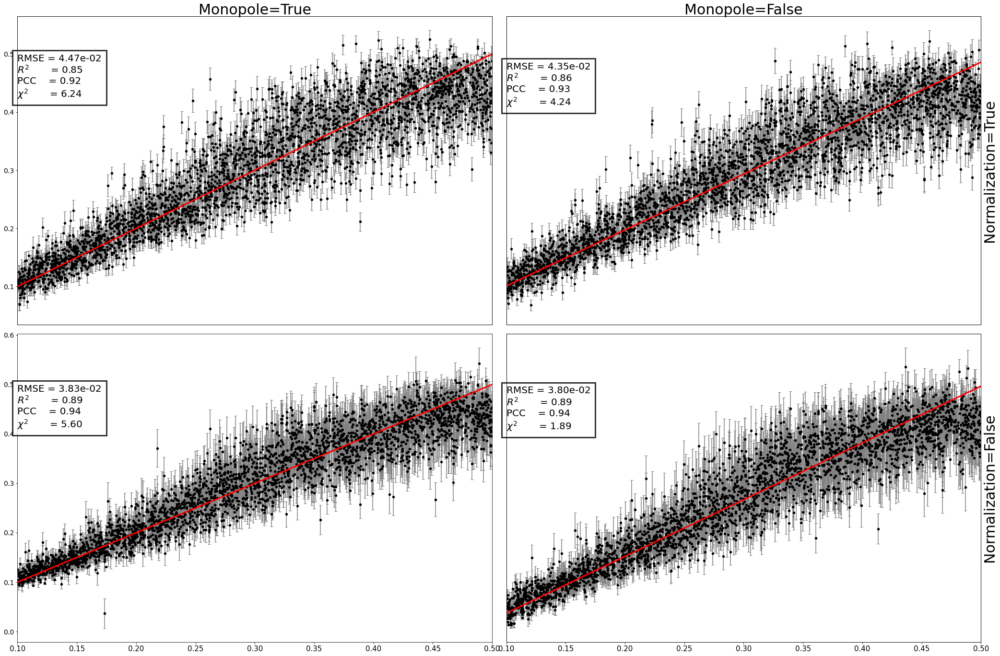

In [29]:
field = 'HI';

fig_shape = (2,2)
axes = generateAxesForMultiplePlots(shape=fig_shape,figsize=(36,24),wspace=0.03,hspace=0.03)
plt.rcParams["font.family"] = "serif"
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
fontsize = 30
ideal1 = np.linspace(0.1,0.5,3)
ideal2 = np.linspace(0.2,1.2,3)


monos = [True, False]
norms = [True, False]
hs    = [0.5, 1, 2]
average = False
sim   = "TNG"
l=0
for i in range(2):
    for j in range(2):
        mono, norm, h = monos[i], norms[j], hs[1]
        fname = "search/{}_{}_mono_{}_norm_{}_h_{}_no_avg".format(sim, field,int(mono),int(norm),h)
        mist = MIST(sim=sim,field=field, extended_L=False,
                    normalization=norm, monopole=mono, average=average)
        mist.load_models(fname=fname, which_machine='vib',z_dim=200, hidden=h, dr=0.5)
        y_true, y_pred = mist.make_plots(show_plot=False, data_return=True)
        y_true = y_true[l][:,0]
        y_mean = y_pred[l][0][:,0]
        y_std  = y_pred[l][1][:,0]
        
        axes[i,j].errorbar(y_true, y_mean, y_std,linestyle="None",ecolor="grey",
                         capsize=3,zorder=0)
        axes[i,j].scatter(y_true, y_mean,s=20,c='k', zorder=10)
        
        RMSE = np.sqrt(mean_squared_error(y_true, y_mean))
        R2   = r2_score(y_true, y_mean)
        PCC  = pearsonr(y_true, y_mean)[0]
        CHI2 = np.mean((y_true-y_mean)**2/y_std**2)
        text = \
r"""{:<5}= {:.2e}
{:<12}= {:.2f}
{:<7}= {:.2f}
{:<15}= {:.2f}""".format("RMSE", RMSE,"$R^2$", R2,
                            "PCC", PCC, "$\chi^2$", CHI2)
        axes[i,j].text(0.1, 0.5, text, fontsize=20,
                       ha='left', va='top',bbox=dict(facecolor='white', alpha=0.8,pad=10,
                                                    edgecolor='black', linewidth=3))
        
        axes[i,j].plot(ideal1,ideal1,"r",lw=3,zorder=12)
        remove_inner_axes(axes,fig_shape)
        axes[i,j].set_xlim(0.1,0.5)
        #axes[i,j].set_ylim(0.1,0.5)
        if j == 0:
            ax = axes[i,j].twiny()
            ax.xaxis.tick_top()
            ax.set_xticks([])
            ax.set_xlabel(r"Monopole={}".format(mono),fontsize=fontsize)
        if i == 1:
            ax = axes[i,j].twinx()
            ax.yaxis.tick_right()
            ax.set_yticks([])
            ax.set_ylabel(r"Normalization={}".format(norm),fontsize=fontsize)
#axes[0,3].set_xlabel("$\Omega_\mathrm{m, true}$", fontsize=fontsize)
#axes[0,3].set_ylabel("$\Omega_\mathrm{m, pred}$", fontsize=fontsize)
#plt.savefig("Exploration_HI_omegam_TNG.png", dpi=200, bbox_inches='tight')

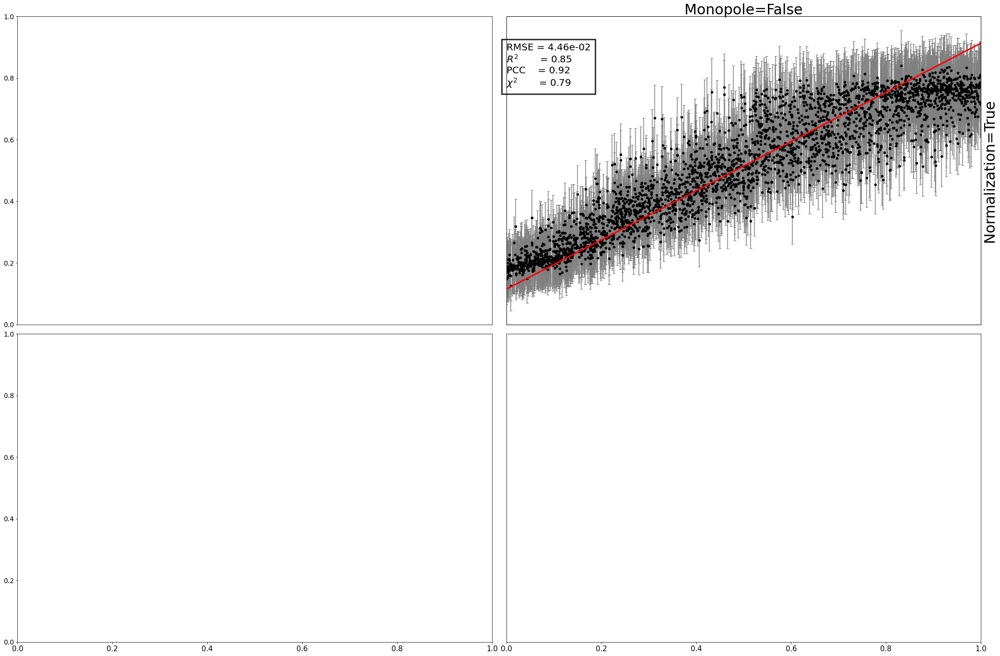

In [18]:
field = 'HI';

fig_shape = (2,2)
axes = generateAxesForMultiplePlots(shape=fig_shape,figsize=(36,24),wspace=0.03,hspace=0.03)
plt.rcParams["font.family"] = "serif"
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
fontsize = 30
ideal1 = np.linspace(0.1,0.5,3)
ideal2 = np.linspace(0.2,1.2,3)


monos = [True, False]
norms = [True, False]
hs    = [0.5, 1, 2]
average = False
l=0
for i in range(1):
    for j in range(1):
        i=1;j=0;
        mono, norm, h = monos[i], norms[j], hs[0]
        fname = "search/TNG+SIMBA_{}_mono_{}_norm_{}_h_{}_no_avg".format(field,int(mono),int(norm),h)
        mist = MIST(sim=["TNG","SIMBA"],field=field, extended_L=False,
                    normalization=norm, monopole=mono, average=average)
        mist.load_models(fname=fname, which_machine='vib+cls_a',z_dim=200, hidden=h, dr=0.5)
        y_true, y_pred = mist.make_plots(show_plot=False, data_return=True)
        y_true = y_true[l][:,0]
        y_mean = y_pred[l][0][:,0]
        y_std  = y_pred[l][1][:,0]
        
        axes[i,j].errorbar(y_true, y_mean, y_std,linestyle="None",ecolor="grey",
                         capsize=3,zorder=0)
        axes[i,j].scatter(y_true, y_mean,s=20,c='k', zorder=10)
        
        RMSE = np.sqrt(mean_squared_error(y_true, y_mean))
        R2   = r2_score(y_true, y_mean)
        PCC  = pearsonr(y_true, y_mean)[0]
        CHI2 = np.mean((y_true-y_mean)**2/y_std**2)
        text = \
r"""{:<5}= {:.2e}
{:<12}= {:.2f}
{:<7}= {:.2f}
{:<15}= {:.2f}""".format("RMSE", RMSE,"$R^2$", R2,
                            "PCC", PCC, "$\chi^2$", CHI2)
        axes[i,j].text(0.1, 0.5, text, fontsize=20,
                       ha='left', va='top',bbox=dict(facecolor='white', alpha=0.8,pad=10,
                                                    edgecolor='black', linewidth=3))
        
        axes[i,j].plot(ideal1,ideal1,"r",lw=3,zorder=12)
        remove_inner_axes(axes,fig_shape)
        axes[i,j].set_xlim(0.1,0.5)
        #axes[i,j].set_ylim(0.1,0.5)
        if j == 0:
            ax = axes[i,j].twiny()
            ax.xaxis.tick_top()
            ax.set_xticks([])
            ax.set_xlabel(r"Monopole={}".format(mono),fontsize=fontsize)
        if i == 1:
            ax = axes[i,j].twinx()
            ax.yaxis.tick_right()
            ax.set_yticks([])
            ax.set_ylabel(r"Normalization={}".format(norm),fontsize=fontsize)
#axes[0,3].set_xlabel("$\Omega_\mathrm{m, true}$", fontsize=fontsize)
#axes[0,3].set_ylabel("$\Omega_\mathrm{m, pred}$", fontsize=fontsize)
#plt.savefig("Exploration_HI_omegam_TNG.png", dpi=200, bbox_inches='tight')

FileNotFoundError: [Errno 2] No such file or directory: './model/search/TNG+SIMBA_HI_mono_1_norm_0_h_0.5_no_avg_vib.pt'

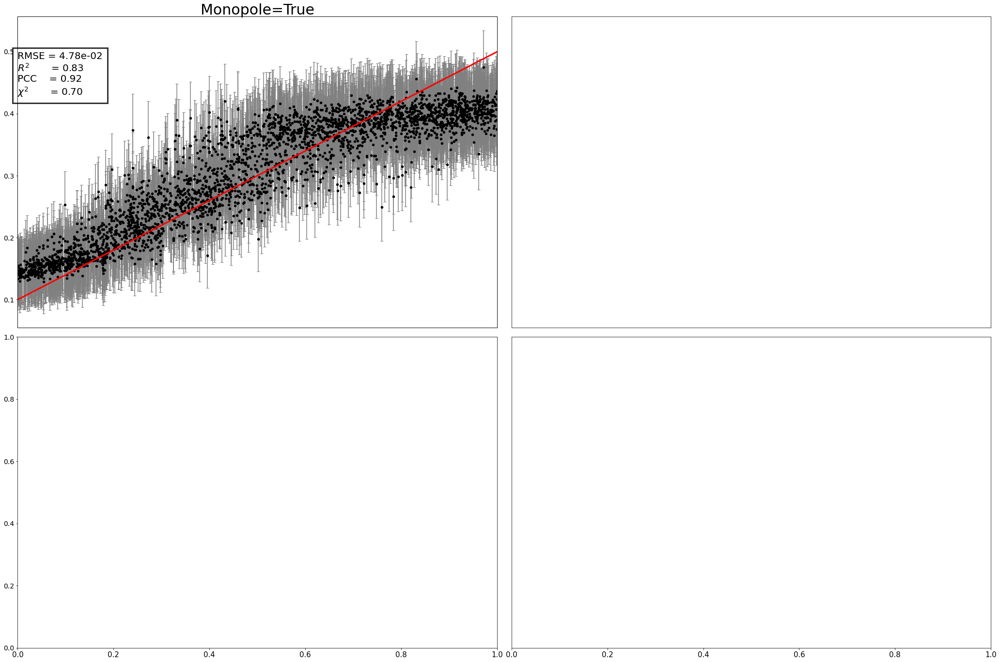

In [16]:
field = 'HI';

fig_shape = (2,2)
axes = generateAxesForMultiplePlots(shape=fig_shape,figsize=(36,24),wspace=0.03,hspace=0.03)
plt.rcParams["font.family"] = "serif"
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
fontsize = 30
ideal1 = np.linspace(0.1,0.5,3)
ideal2 = np.linspace(0.2,1.2,3)


monos = [True, False]
norms = [True, False]
hs    = [0.5, 1, 2]
average = False
l=0
for i in range(2):
    for j in range(2):
        mono, norm, h = monos[i], norms[j], hs[0]
        fname = "search/TNG+SIMBA_{}_mono_{}_norm_{}_h_{}_no_avg".format(field,int(mono),int(norm),h)
        mist = MIST(sim=["TNG","SIMBA"],field=field, extended_L=False,
                    normalization=norm, monopole=mono, average=average)
        mist.load_models(fname=fname, which_machine='vib+cls_a',z_dim=200, hidden=h, dr=0.5)
        y_true, y_pred = mist.make_plots(show_plot=False, data_return=True)
        y_true = y_true[l][:,0]
        y_mean = y_pred[l][0][:,0]
        y_std  = y_pred[l][1][:,0]
        
        axes[i,j].errorbar(y_true, y_mean, y_std,linestyle="None",ecolor="grey",
                         capsize=3,zorder=0)
        axes[i,j].scatter(y_true, y_mean,s=20,c='k', zorder=10)
        
        RMSE = np.sqrt(mean_squared_error(y_true, y_mean))
        R2   = r2_score(y_true, y_mean)
        PCC  = pearsonr(y_true, y_mean)[0]
        CHI2 = np.mean((y_true-y_mean)**2/y_std**2)
        text = \
r"""{:<5}= {:.2e}
{:<12}= {:.2f}
{:<7}= {:.2f}
{:<15}= {:.2f}""".format("RMSE", RMSE,"$R^2$", R2,
                            "PCC", PCC, "$\chi^2$", CHI2)
        axes[i,j].text(0.1, 0.5, text, fontsize=20,
                       ha='left', va='top',bbox=dict(facecolor='white', alpha=0.8,pad=10,
                                                    edgecolor='black', linewidth=3))
        
        axes[i,j].plot(ideal1,ideal1,"r",lw=3,zorder=12)
        remove_inner_axes(axes,fig_shape)
        axes[i,j].set_xlim(0.1,0.5)
        #axes[i,j].set_ylim(0.1,0.5)
        if j == 0:
            ax = axes[i,j].twiny()
            ax.xaxis.tick_top()
            ax.set_xticks([])
            ax.set_xlabel(r"Monopole={}".format(mono),fontsize=fontsize)
        if i == 1:
            ax = axes[i,j].twinx()
            ax.yaxis.tick_right()
            ax.set_yticks([])
            ax.set_ylabel(r"Normalization={}".format(norm),fontsize=fontsize)
#axes[0,3].set_xlabel("$\Omega_\mathrm{m, true}$", fontsize=fontsize)
#axes[0,3].set_ylabel("$\Omega_\mathrm{m, pred}$", fontsize=fontsize)
#plt.savefig("Exploration_HI_omegam_TNG.png", dpi=200, bbox_inches='tight')

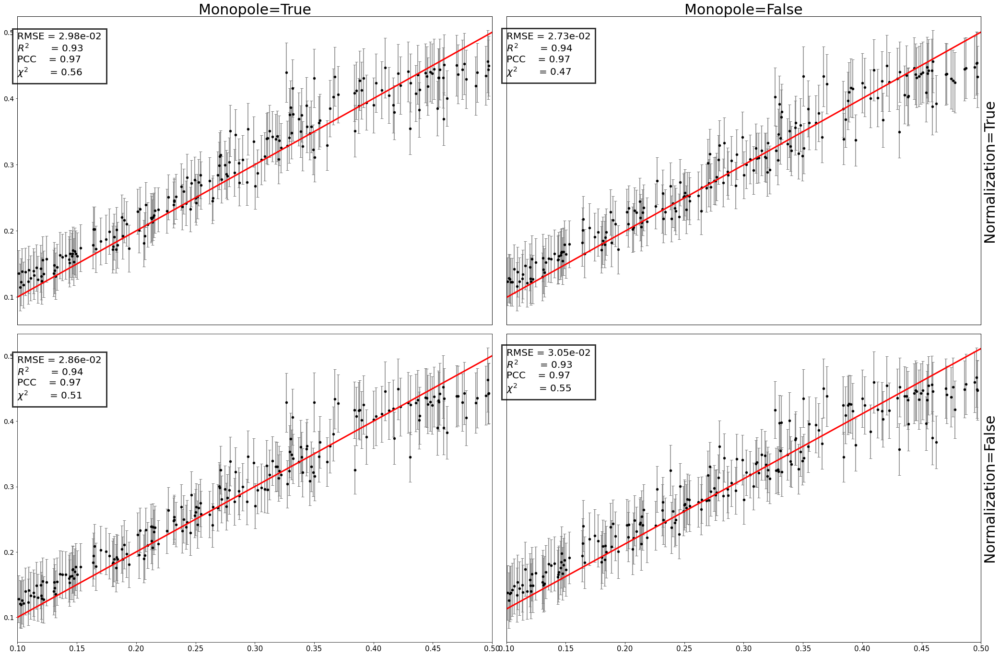

In [32]:
field = 'HI';

fig_shape = (2,2)
axes = generateAxesForMultiplePlots(shape=fig_shape,figsize=(36,24),wspace=0.03,hspace=0.03)
plt.rcParams["font.family"] = "serif"
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
fontsize = 30
ideal1 = np.linspace(0.1,0.5,3)
ideal2 = np.linspace(0.2,1.2,3)


monos = [True, False]
norms = [True, False]
hs    = [0.5, 1, 2]
l=0
for i in range(2):
    for j in range(2):
        mono, norm, h = monos[i], norms[j], hs[0]
        fname = "search/TNG+SIMBA_{}_mono_{}_norm_{}_h_{}".format(field,int(mono),int(norm),h)
        mist = MIST(sim=["TNG","SIMBA"],field=field, extended_L=False,
                    normalization=norm, monopole=mono)
        mist.load_models(fname=fname, which_machine='vib+cls_a',z_dim=200, hidden=h, dr=0.5)
        y_true, y_pred = mist.make_plots(show_plot=False, data_return=True)
        y_true = y_true[l][:,0]
        y_mean = y_pred[l][0][:,0]
        y_std  = y_pred[l][1][:,0]
        
        axes[i,j].errorbar(y_true, y_mean, y_std,linestyle="None",ecolor="grey",
                         capsize=3,zorder=0)
        axes[i,j].scatter(y_true, y_mean,s=20,c='k', zorder=10)
        
        RMSE = np.sqrt(mean_squared_error(y_true, y_mean))
        R2   = r2_score(y_true, y_mean)
        PCC  = pearsonr(y_true, y_mean)[0]
        CHI2 = np.mean((y_true-y_mean)**2/y_std**2)
        text = \
r"""{:<5}= {:.2e}
{:<12}= {:.2f}
{:<7}= {:.2f}
{:<15}= {:.2f}""".format("RMSE", RMSE,"$R^2$", R2,
                            "PCC", PCC, "$\chi^2$", CHI2)
        axes[i,j].text(0.1, 0.5, text, fontsize=20,
                       ha='left', va='top',bbox=dict(facecolor='white', alpha=0.8,pad=10,
                                                    edgecolor='black', linewidth=3))
        
        axes[i,j].plot(ideal1,ideal1,"r",lw=3,zorder=12)
        remove_inner_axes(axes,fig_shape)
        axes[i,j].set_xlim(0.1,0.5)
        #axes[i,j].set_ylim(0.1,0.5)
        if j == 0:
            ax = axes[i,j].twiny()
            ax.xaxis.tick_top()
            ax.set_xticks([])
            ax.set_xlabel(r"Monopole={}".format(mono),fontsize=fontsize)
        if i == 1:
            ax = axes[i,j].twinx()
            ax.yaxis.tick_right()
            ax.set_yticks([])
            ax.set_ylabel(r"Normalization={}".format(norm),fontsize=fontsize)
#axes[0,3].set_xlabel("$\Omega_\mathrm{m, true}$", fontsize=fontsize)
#axes[0,3].set_ylabel("$\Omega_\mathrm{m, pred}$", fontsize=fontsize)
#plt.savefig("Exploration_HI_omegam_TNG.png", dpi=200, bbox_inches='tight')

0.024411430015014418 0.37795966227778666
0.02370237099090386 0.35040306680148803
0.025539084378825235 0.39724300253657036
0.02685599501653836 0.42270103932089226


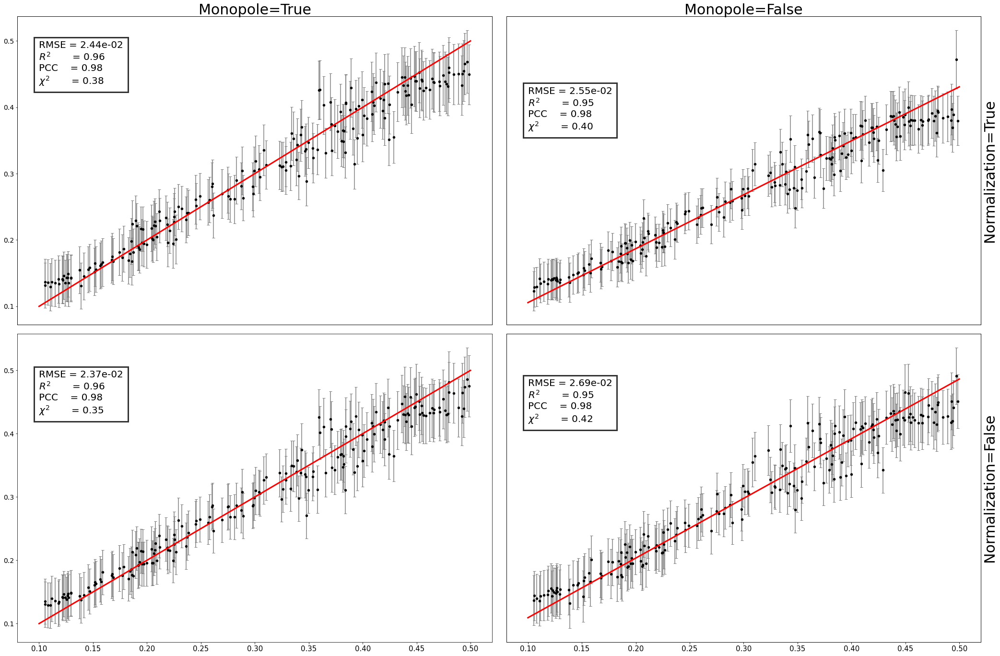

In [33]:
field = 'HI';

fig_shape = (2,2)
axes = generateAxesForMultiplePlots(shape=fig_shape,figsize=(36,24),wspace=0.03,hspace=0.03)
plt.rcParams["font.family"] = "serif"
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
fontsize = 30
ideal1 = np.linspace(0.1,0.5,3)
ideal2 = np.linspace(0.2,1.2,3)


monos = [True, False]
norms = [True, False]
hs    = [0.5, 1, 2]
l=1
for i in range(2):
    for j in range(2):
        mono, norm, h = monos[i], norms[j], hs[1]
        fname = "search/TNG+SIMBA_{}_mono_{}_norm_{}_h_{}".format(field,int(mono),int(norm),h)
        mist = MIST(sim=["TNG","SIMBA"],field=field, extended_L=False,
                    normalization=norm, monopole=mono)
        mist.load_models(fname=fname, which_machine='vib+cls_a',z_dim=200, hidden=h, dr=0.5)
        y_true, y_pred = mist.make_plots(show_plot=False, data_return=True)
        y_true = y_true[l][:,0]
        y_mean = y_pred[l][0][:,0]
        y_std  = y_pred[l][1][:,0]
        y_true = y_true[y_mean>0]
        y_std  = y_std[y_mean>0]
        y_mean = y_mean[y_mean>0]
        
        axes[i,j].errorbar(y_true, y_mean, y_std,linestyle="None",ecolor="grey",
                         capsize=3,zorder=0)
        axes[i,j].scatter(y_true, y_mean,s=20,c='k', zorder=10)
        
        RMSE = np.sqrt(mean_squared_error(y_true, y_mean))
        R2   = r2_score(y_true, y_mean)
        PCC  = pearsonr(y_true, y_mean)[0]
        CHI2 = np.mean((y_true-y_mean)**2/y_std**2)
        print(RMSE, CHI2)
        text = \
r"""{:<5}= {:.2e}
{:<12}= {:.2f}
{:<7}= {:.2f}
{:<15}= {:.2f}""".format("RMSE", RMSE,"$R^2$", R2,
                            "PCC", PCC, "$\chi^2$", CHI2)
        axes[i,j].text(0.1, 0.5, text, fontsize=20,
                       ha='left', va='top',bbox=dict(facecolor='white', alpha=0.8,pad=10,
                                                    edgecolor='black', linewidth=3))
        
        axes[i,j].plot(ideal1,ideal1,"r",lw=3,zorder=12)
        remove_inner_axes(axes,fig_shape)
        #axes[i,j].set_xlim(0.1,0.5)
        #axes[i,j].set_ylim(0.1,0.5)
        if j == 0:
            ax = axes[i,j].twiny()
            ax.xaxis.tick_top()
            ax.set_xticks([])
            ax.set_xlabel(r"Monopole={}".format(mono),fontsize=fontsize)
        if i == 1:
            ax = axes[i,j].twinx()
            ax.yaxis.tick_right()
            ax.set_yticks([])
            ax.set_ylabel(r"Normalization={}".format(norm),fontsize=fontsize)
#axes[0,3].set_xlabel("$\Omega_\mathrm{m, true}$", fontsize=fontsize)
#axes[0,3].set_ylabel("$\Omega_\mathrm{m, pred}$", fontsize=fontsize)
#plt.savefig("Exploration_HI_omegam_TNG.png", dpi=200, bbox_inches='tight')

0.14503227102340607 2.3100704701320947
0.10520937280992763 1.0543733940591145
0.07319424031342736 0.8036311233168769
0.06721941627987851 0.8679832183387931


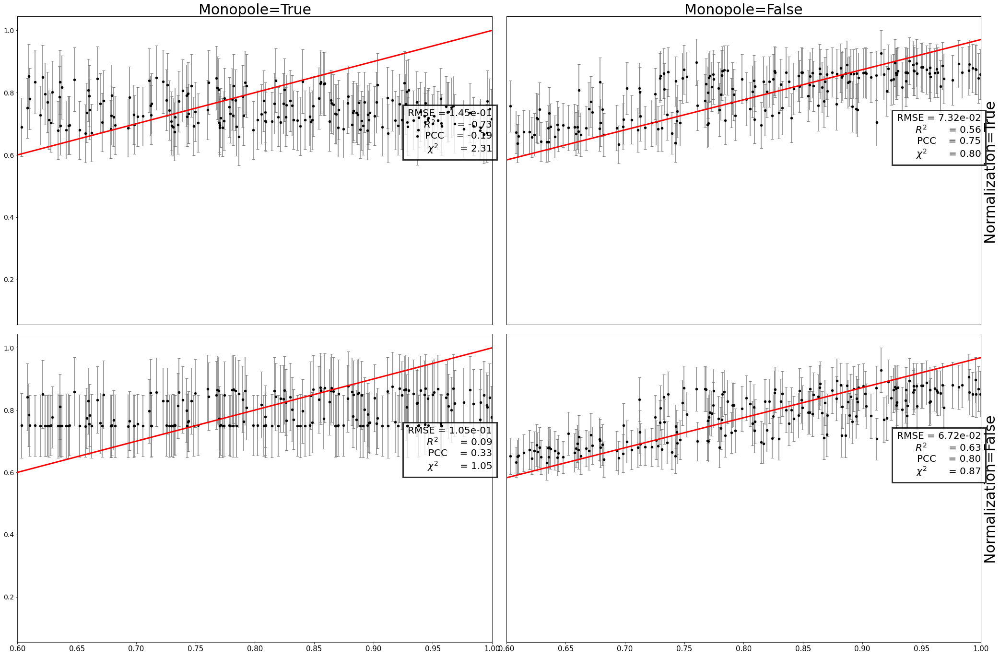

In [42]:
field = 'T';

fig_shape = (2,2)
axes = generateAxesForMultiplePlots(shape=fig_shape,figsize=(36,24),wspace=0.03,hspace=0.03)
plt.rcParams["font.family"] = "serif"
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
fontsize = 30
ideal1 = np.linspace(0.1,1,3)
ideal2 = np.linspace(0.2,1.2,3)


monos = [True, False]
norms = [True, False]
hs    = [0.5, 1, 2]
l=0
m=1
for i in range(2):
    for j in range(2):
        mono, norm, h = monos[i], norms[j], hs[1]
        fname = "search/TNG+SIMBA_{}_mono_{}_norm_{}_h_{}".format(field,int(mono),int(norm),h)
        mist = MIST(sim=["TNG","SIMBA"],field=field, extended_L=False,
                    normalization=norm, monopole=mono)
        mist.load_models(fname=fname, which_machine='vib+cls_a',z_dim=200, hidden=h, dr=0.5)
        y_true, y_pred = mist.make_plots(show_plot=False, data_return=True)
        y_true = y_true[l][:,m]
        y_mean = y_pred[l][0][:,m]
        y_std  = y_pred[l][1][:,m]
        y_true = y_true[y_mean>0]
        y_std  = y_std[y_mean>0]
        y_mean = y_mean[y_mean>0]
        
        axes[i,j].errorbar(y_true, y_mean, y_std,linestyle="None",ecolor="grey",
                         capsize=3,zorder=0)
        axes[i,j].scatter(y_true, y_mean,s=20,c='k', zorder=10)
        
        RMSE = np.sqrt(mean_squared_error(y_true, y_mean))
        R2   = r2_score(y_true, y_mean)
        PCC  = pearsonr(y_true, y_mean)[0]
        CHI2 = np.mean((y_true-y_mean)**2/y_std**2)
        print(RMSE, CHI2)
        text = \
r"""{:<5}= {:.2e}
{:<12}= {:.2f}
{:<7}= {:.2f}
{:<15}= {:.2f}""".format("RMSE", RMSE,"$R^2$", R2,
                            "PCC", PCC, "$\chi^2$", CHI2)
        axes[i,j].text(1, 0.6, text, fontsize=20,
                       ha='right', va='bottom',bbox=dict(facecolor='white', alpha=0.8,pad=10,
                                                    edgecolor='black', linewidth=3))
        
        axes[i,j].plot(ideal1,ideal1,"r",lw=3,zorder=12)
        remove_inner_axes(axes,fig_shape)
        #axes[i,j].set_xlim(0.1,0.5)
        axes[i,j].set_xlim(0.6,1)
        if j == 0:
            ax = axes[i,j].twiny()
            ax.xaxis.tick_top()
            ax.set_xticks([])
            ax.set_xlabel(r"Monopole={}".format(mono),fontsize=fontsize)
        if i == 1:
            ax = axes[i,j].twinx()
            ax.yaxis.tick_right()
            ax.set_yticks([])
            ax.set_ylabel(r"Normalization={}".format(norm),fontsize=fontsize)
#axes[0,3].set_xlabel("$\Omega_\mathrm{m, true}$", fontsize=fontsize)
#axes[0,3].set_ylabel("$\Omega_\mathrm{m, pred}$", fontsize=fontsize)
#plt.savefig("Exploration_HI_omegam_TNG.png", dpi=200, bbox_inches='tight')

0.18900112245204312 4.248956146716418
0.10478187461684844 1.010117427859828
0.11311520684105136 1.8717269333930504
0.10565578547844989 2.1308005385502233


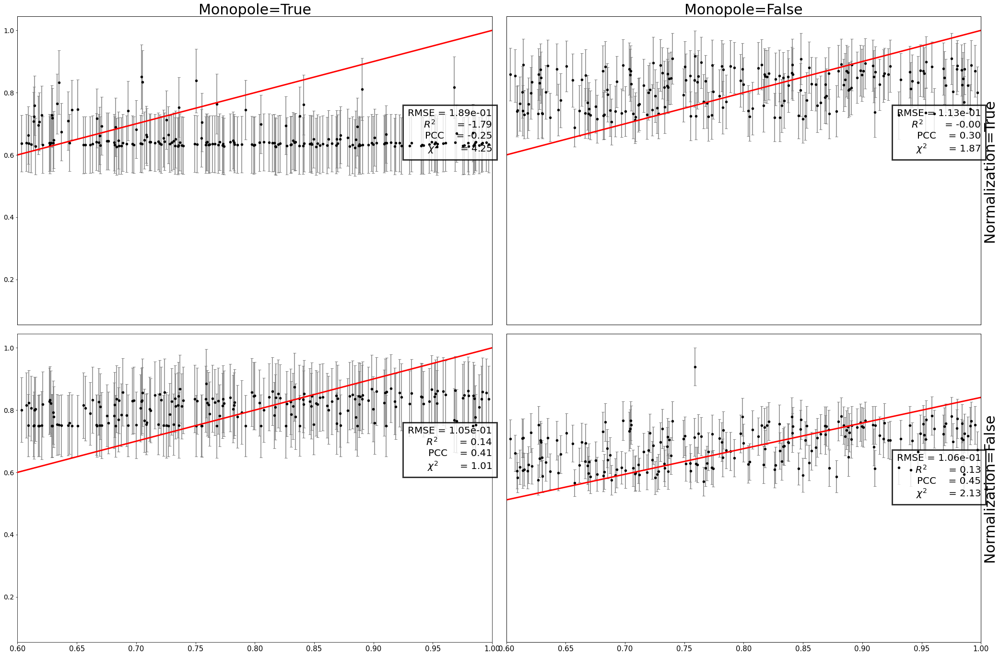

In [44]:
field = 'T';

fig_shape = (2,2)
axes = generateAxesForMultiplePlots(shape=fig_shape,figsize=(36,24),wspace=0.03,hspace=0.03)
plt.rcParams["font.family"] = "serif"
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
fontsize = 30
ideal1 = np.linspace(0.1,1,3)
ideal2 = np.linspace(0.2,1.2,3)


monos = [True, False]
norms = [True, False]
hs    = [0.5, 1, 2]
l=1
m=1
for i in range(2):
    for j in range(2):
        mono, norm, h = monos[i], norms[j], hs[1]
        fname = "search/TNG+SIMBA_{}_mono_{}_norm_{}_h_{}".format(field,int(mono),int(norm),h)
        mist = MIST(sim=["TNG","SIMBA"],field=field, extended_L=False,
                    normalization=norm, monopole=mono)
        mist.load_models(fname=fname, which_machine='vib+cls_a',z_dim=200, hidden=h, dr=0.5)
        y_true, y_pred = mist.make_plots(show_plot=False, data_return=True)
        y_true = y_true[l][:,m]
        y_mean = y_pred[l][0][:,m]
        y_std  = y_pred[l][1][:,m]
        y_true = y_true[y_mean>0]
        y_std  = y_std[y_mean>0]
        y_mean = y_mean[y_mean>0]
        
        axes[i,j].errorbar(y_true, y_mean, y_std,linestyle="None",ecolor="grey",
                         capsize=3,zorder=0)
        axes[i,j].scatter(y_true, y_mean,s=20,c='k', zorder=10)
        
        RMSE = np.sqrt(mean_squared_error(y_true, y_mean))
        R2   = r2_score(y_true, y_mean)
        PCC  = pearsonr(y_true, y_mean)[0]
        CHI2 = np.mean((y_true-y_mean)**2/y_std**2)
        print(RMSE, CHI2)
        text = \
r"""{:<5}= {:.2e}
{:<12}= {:.2f}
{:<7}= {:.2f}
{:<15}= {:.2f}""".format("RMSE", RMSE,"$R^2$", R2,
                            "PCC", PCC, "$\chi^2$", CHI2)
        axes[i,j].text(1, 0.6, text, fontsize=20,
                       ha='right', va='bottom',bbox=dict(facecolor='white', alpha=0.8,pad=10,
                                                    edgecolor='black', linewidth=3))
        
        axes[i,j].plot(ideal1,ideal1,"r",lw=3,zorder=12)
        remove_inner_axes(axes,fig_shape)
        #axes[i,j].set_xlim(0.1,0.5)
        axes[i,j].set_xlim(0.6,1)
        if j == 0:
            ax = axes[i,j].twiny()
            ax.xaxis.tick_top()
            ax.set_xticks([])
            ax.set_xlabel(r"Monopole={}".format(mono),fontsize=fontsize)
        if i == 1:
            ax = axes[i,j].twinx()
            ax.yaxis.tick_right()
            ax.set_yticks([])
            ax.set_ylabel(r"Normalization={}".format(norm),fontsize=fontsize)
#axes[0,3].set_xlabel("$\Omega_\mathrm{m, true}$", fontsize=fontsize)
#axes[0,3].set_ylabel("$\Omega_\mathrm{m, pred}$", fontsize=fontsize)
#plt.savefig("Exploration_HI_omegam_TNG.png", dpi=200, bbox_inches='tight')

0.05277663526844983 1.0999066011500194
0.0333728290595907 0.4344285781813338
0.04066258459526885 0.563586066916536
0.039958038015918095 0.5341236734666465


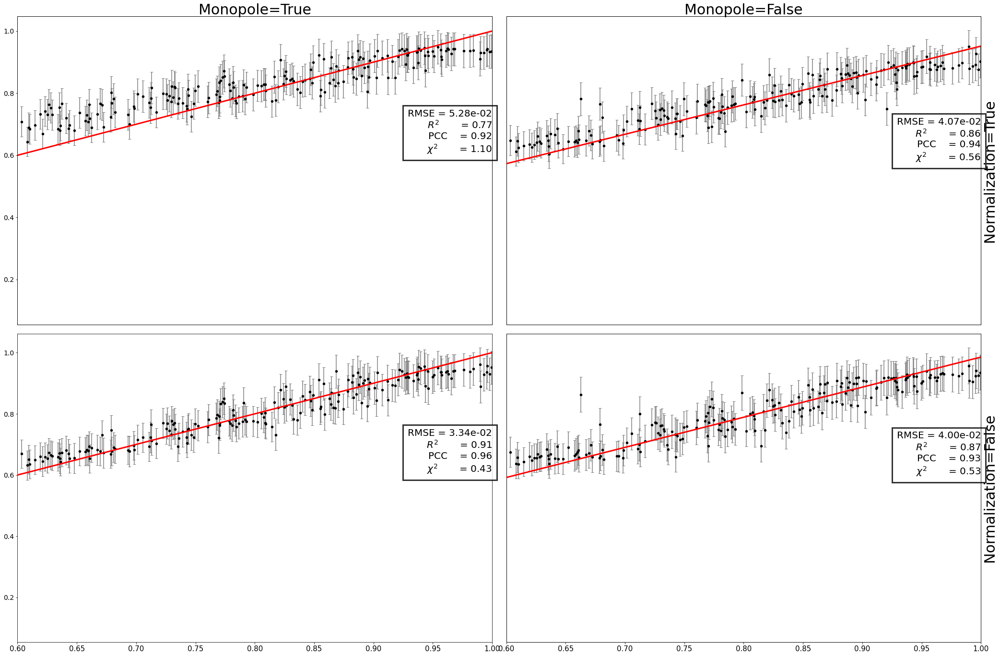

In [45]:
field = 'HI';

fig_shape = (2,2)
axes = generateAxesForMultiplePlots(shape=fig_shape,figsize=(36,24),wspace=0.03,hspace=0.03)
plt.rcParams["font.family"] = "serif"
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
fontsize = 30
ideal1 = np.linspace(0.1,1,3)
ideal2 = np.linspace(0.2,1.2,3)


monos = [True, False]
norms = [True, False]
hs    = [0.5, 1, 2]
l=0
m=1
for i in range(2):
    for j in range(2):
        mono, norm, h = monos[i], norms[j], hs[1]
        fname = "search/TNG+SIMBA_{}_mono_{}_norm_{}_h_{}".format(field,int(mono),int(norm),h)
        mist = MIST(sim=["TNG","SIMBA"],field=field, extended_L=False,
                    normalization=norm, monopole=mono)
        mist.load_models(fname=fname, which_machine='vib+cls_a',z_dim=200, hidden=h, dr=0.5)
        y_true, y_pred = mist.make_plots(show_plot=False, data_return=True)
        y_true = y_true[l][:,m]
        y_mean = y_pred[l][0][:,m]
        y_std  = y_pred[l][1][:,m]
        y_true = y_true[y_mean>0.5]
        y_std  = y_std[y_mean>0.5]
        y_mean = y_mean[y_mean>0.5]
        
        axes[i,j].errorbar(y_true, y_mean, y_std,linestyle="None",ecolor="grey",
                         capsize=3,zorder=0)
        axes[i,j].scatter(y_true, y_mean,s=20,c='k', zorder=10)
        
        RMSE = np.sqrt(mean_squared_error(y_true, y_mean))
        R2   = r2_score(y_true, y_mean)
        PCC  = pearsonr(y_true, y_mean)[0]
        CHI2 = np.mean((y_true-y_mean)**2/y_std**2)
        print(RMSE, CHI2)
        text = \
r"""{:<5}= {:.2e}
{:<12}= {:.2f}
{:<7}= {:.2f}
{:<15}= {:.2f}""".format("RMSE", RMSE,"$R^2$", R2,
                            "PCC", PCC, "$\chi^2$", CHI2)
        axes[i,j].text(1, 0.6, text, fontsize=20,
                       ha='right', va='bottom',bbox=dict(facecolor='white', alpha=0.8,pad=10,
                                                    edgecolor='black', linewidth=3))
        
        axes[i,j].plot(ideal1,ideal1,"r",lw=3,zorder=12)
        remove_inner_axes(axes,fig_shape)
        #axes[i,j].set_xlim(0.1,0.5)
        axes[i,j].set_xlim(0.6,1)
        if j == 0:
            ax = axes[i,j].twiny()
            ax.xaxis.tick_top()
            ax.set_xticks([])
            ax.set_xlabel(r"Monopole={}".format(mono),fontsize=fontsize)
        if i == 1:
            ax = axes[i,j].twinx()
            ax.yaxis.tick_right()
            ax.set_yticks([])
            ax.set_ylabel(r"Normalization={}".format(norm),fontsize=fontsize)
#axes[0,3].set_xlabel("$\Omega_\mathrm{m, true}$", fontsize=fontsize)
#axes[0,3].set_ylabel("$\Omega_\mathrm{m, pred}$", fontsize=fontsize)
#plt.savefig("Exploration_HI_omegam_TNG.png", dpi=200, bbox_inches='tight')

0.06679015435207948 1.731477397105063
0.06571876216200799 1.6711934014473109
0.07107188306921 1.666431282077474
0.07167088659736941 1.6893643101891922


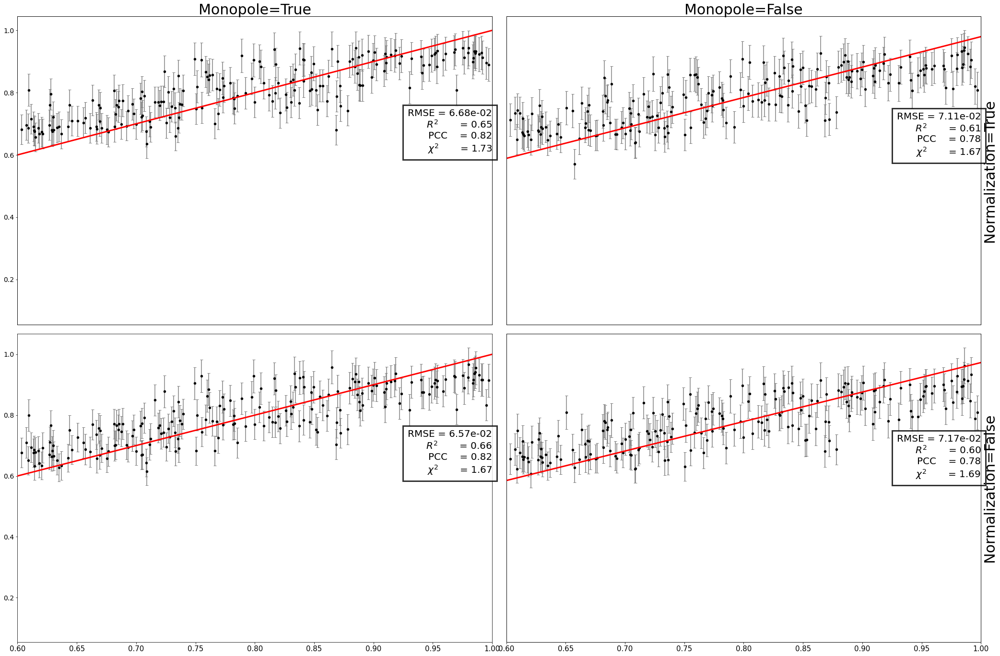

In [43]:
field = 'HI';

fig_shape = (2,2)
axes = generateAxesForMultiplePlots(shape=fig_shape,figsize=(36,24),wspace=0.03,hspace=0.03)
plt.rcParams["font.family"] = "serif"
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
fontsize = 30
ideal1 = np.linspace(0.1,1,3)
ideal2 = np.linspace(0.2,1.2,3)


monos = [True, False]
norms = [True, False]
hs    = [0.5, 1, 2]
l=1
m=1
for i in range(2):
    for j in range(2):
        mono, norm, h = monos[i], norms[j], hs[1]
        fname = "search/TNG+SIMBA_{}_mono_{}_norm_{}_h_{}".format(field,int(mono),int(norm),h)
        mist = MIST(sim=["TNG","SIMBA"],field=field, extended_L=False,
                    normalization=norm, monopole=mono)
        mist.load_models(fname=fname, which_machine='vib+cls_a',z_dim=200, hidden=h, dr=0.5)
        y_true, y_pred = mist.make_plots(show_plot=False, data_return=True)
        y_true = y_true[l][:,m]
        y_mean = y_pred[l][0][:,m]
        y_std  = y_pred[l][1][:,m]
        y_true = y_true[y_mean>0.5]
        y_std  = y_std[y_mean>0.5]
        y_mean = y_mean[y_mean>0.5]
        
        axes[i,j].errorbar(y_true, y_mean, y_std,linestyle="None",ecolor="grey",
                         capsize=3,zorder=0)
        axes[i,j].scatter(y_true, y_mean,s=20,c='k', zorder=10)
        
        RMSE = np.sqrt(mean_squared_error(y_true, y_mean))
        R2   = r2_score(y_true, y_mean)
        PCC  = pearsonr(y_true, y_mean)[0]
        CHI2 = np.mean((y_true-y_mean)**2/y_std**2)
        print(RMSE, CHI2)
        text = \
r"""{:<5}= {:.2e}
{:<12}= {:.2f}
{:<7}= {:.2f}
{:<15}= {:.2f}""".format("RMSE", RMSE,"$R^2$", R2,
                            "PCC", PCC, "$\chi^2$", CHI2)
        axes[i,j].text(1, 0.6, text, fontsize=20,
                       ha='right', va='bottom',bbox=dict(facecolor='white', alpha=0.8,pad=10,
                                                    edgecolor='black', linewidth=3))
        
        axes[i,j].plot(ideal1,ideal1,"r",lw=3,zorder=12)
        remove_inner_axes(axes,fig_shape)
        #axes[i,j].set_xlim(0.1,0.5)
        axes[i,j].set_xlim(0.6,1)
        if j == 0:
            ax = axes[i,j].twiny()
            ax.xaxis.tick_top()
            ax.set_xticks([])
            ax.set_xlabel(r"Monopole={}".format(mono),fontsize=fontsize)
        if i == 1:
            ax = axes[i,j].twinx()
            ax.yaxis.tick_right()
            ax.set_yticks([])
            ax.set_ylabel(r"Normalization={}".format(norm),fontsize=fontsize)
#axes[0,3].set_xlabel("$\Omega_\mathrm{m, true}$", fontsize=fontsize)
#axes[0,3].set_ylabel("$\Omega_\mathrm{m, pred}$", fontsize=fontsize)
#plt.savefig("Exploration_HI_omegam_TNG.png", dpi=200, bbox_inches='tight')

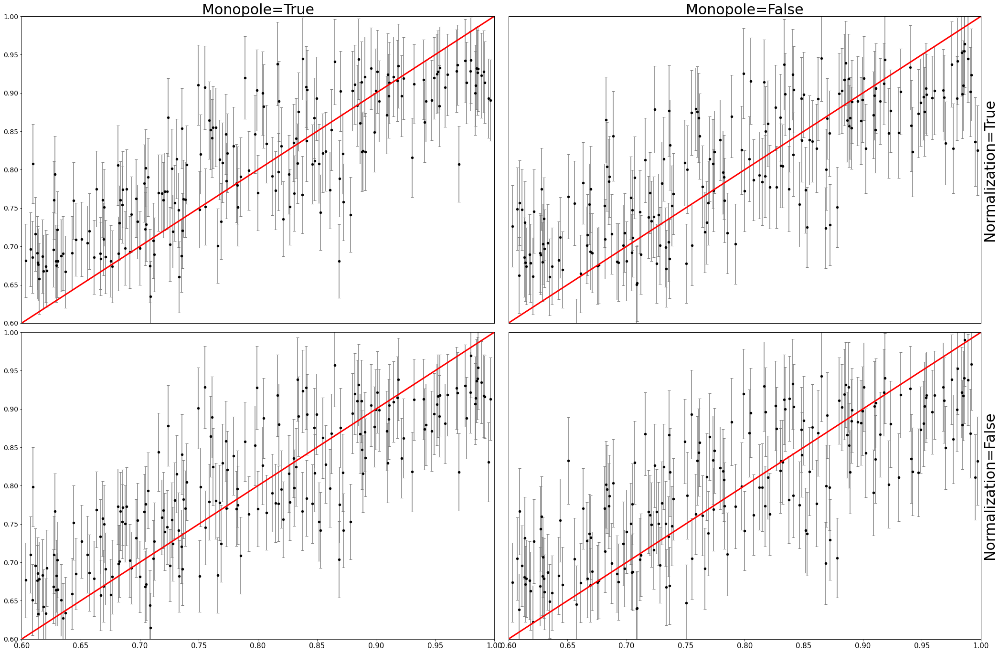

In [9]:
field = 'HI';

fig_shape = (2,2)
axes = generateAxesForMultiplePlots(shape=fig_shape,figsize=(36,24),wspace=0.03,hspace=0.03)
plt.rcParams["font.family"] = "serif"
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
fontsize = 30
ideal1 = np.linspace(0.1,1,3)
ideal2 = np.linspace(0.2,1.2,3)


monos = [True, False]
norms = [True, False]
hs    = [0.5, 1, 2]
l=1
for i in range(2):
    for j in range(2):
        mono, norm, h = monos[i], norms[j], hs[1]
        fname = "search/TNG+SIMBA_{}_mono_{}_norm_{}_h_{}".format(field,int(mono),int(norm),h)
        mist = MIST(sim=["TNG","SIMBA"],field=field, extended_L=False,
                    normalization=norm, monopole=mono)
        mist.load_models(fname=fname, which_machine='vib+cls_a',z_dim=200, hidden=h, dr=0.5)
        y_true, y_pred = mist.make_plots(show_plot=False, data_return=True)
        axes[i,j].errorbar(y_true[l][:,1], y_pred[l][0][:,1], y_pred[l][1][:,1],linestyle="None",ecolor="grey",
                         capsize=3,zorder=0)
        axes[i,j].scatter(y_true[l][:,1], y_pred[l][0][:,1],s=20,c='k', zorder=10)
        axes[i,j].plot(ideal1,ideal1,"r",lw=3,zorder=12)
        remove_inner_axes(axes,fig_shape)
        axes[i,j].set_xlim(0.6,1.0)
        axes[i,j].set_ylim(0.6,1.0)
        if j == 0:
            ax = axes[i,j].twiny()
            ax.xaxis.tick_top()
            ax.set_xticks([])
            ax.set_xlabel(r"Monopole={}".format(mono),fontsize=fontsize)
        if i == 1:
            ax = axes[i,j].twinx()
            ax.yaxis.tick_right()
            ax.set_yticks([])
            ax.set_ylabel(r"Normalization={}".format(norm),fontsize=fontsize)
#axes[0,3].set_xlabel("$\Omega_\mathrm{m, true}$", fontsize=fontsize)
#axes[0,3].set_ylabel("$\Omega_\mathrm{m, pred}$", fontsize=fontsize)
#plt.savefig("Exploration_HI_omegam_TNG.png", dpi=200, bbox_inches='tight')

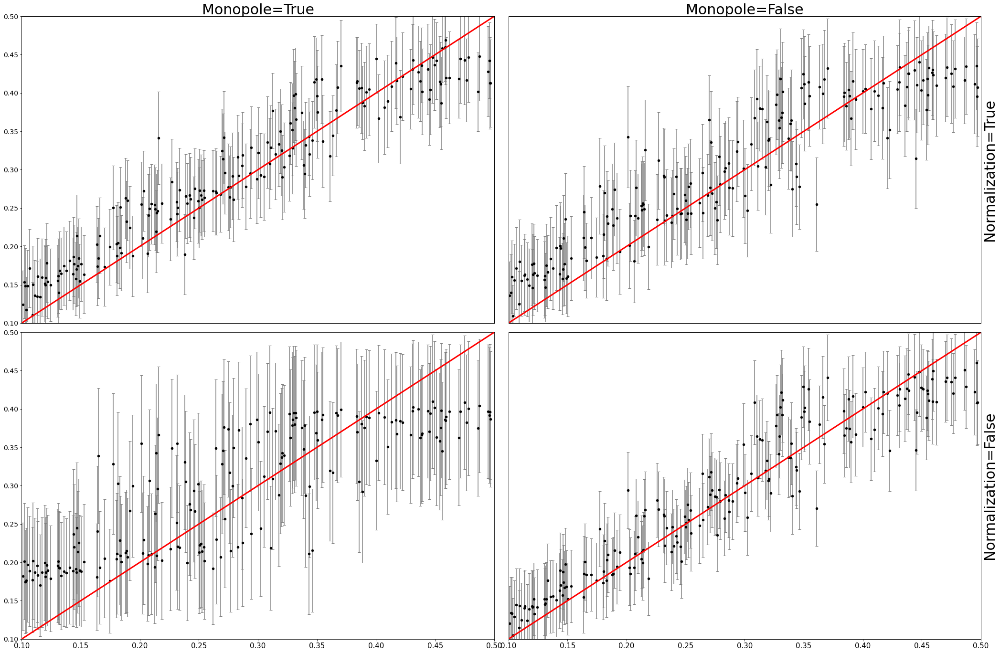

In [7]:
field = 'T';

fig_shape = (2,2)
axes = generateAxesForMultiplePlots(shape=fig_shape,figsize=(36,24),wspace=0.03,hspace=0.03)
plt.rcParams["font.family"] = "serif"
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
fontsize = 30
ideal1 = np.linspace(0.1,0.5,3)
ideal2 = np.linspace(0.2,1.2,3)


monos = [True, False]
norms = [True, False]
hs    = [0.5, 1, 2]
l=0
for i in range(2):
    for j in range(2):
        mono, norm, h = monos[i], norms[j], hs[1]
        fname = "search/TNG+SIMBA_{}_mono_{}_norm_{}_h_{}".format(field,int(mono),int(norm),h)
        mist = MIST(sim=["TNG","SIMBA"],field=field, extended_L=False,
                    normalization=norm, monopole=mono)
        mist.load_models(fname=fname, which_machine='vib+cls_a',z_dim=200, hidden=h, dr=0.5)
        y_true, y_pred = mist.make_plots(show_plot=False, data_return=True)
        axes[i,j].errorbar(y_true[l][:,0], y_pred[l][0][:,0], y_pred[l][1][:,0],linestyle="None",ecolor="grey",
                         capsize=3,zorder=0)
        axes[i,j].scatter(y_true[l][:,0], y_pred[l][0][:,0],s=20,c='k', zorder=10)
        axes[i,j].plot(ideal1,ideal1,"r",lw=3,zorder=12)
        remove_inner_axes(axes,fig_shape)
        axes[i,j].set_xlim(0.1,0.5)
        axes[i,j].set_ylim(0.1,0.5)
        if j == 0:
            ax = axes[i,j].twiny()
            ax.xaxis.tick_top()
            ax.set_xticks([])
            ax.set_xlabel(r"Monopole={}".format(mono),fontsize=fontsize)
        if i == 1:
            ax = axes[i,j].twinx()
            ax.yaxis.tick_right()
            ax.set_yticks([])
            ax.set_ylabel(r"Normalization={}".format(norm),fontsize=fontsize)
#axes[0,3].set_xlabel("$\Omega_\mathrm{m, true}$", fontsize=fontsize)
#axes[0,3].set_ylabel("$\Omega_\mathrm{m, pred}$", fontsize=fontsize)
#plt.savefig("Exploration_HI_omegam_TNG.png", dpi=200, bbox_inches='tight')

RuntimeError: Error(s) in loading state_dict for VIB_a:
	size mismatch for nn_encoder.0.weight: copying a param with shape torch.Size([4504, 9009]) from checkpoint, the shape in current model is torch.Size([1552, 3105]).
	size mismatch for nn_encoder.0.bias: copying a param with shape torch.Size([4504]) from checkpoint, the shape in current model is torch.Size([1552]).
	size mismatch for nn_encoder.3.weight: copying a param with shape torch.Size([2252, 4504]) from checkpoint, the shape in current model is torch.Size([776, 1552]).
	size mismatch for nn_encoder.3.bias: copying a param with shape torch.Size([2252]) from checkpoint, the shape in current model is torch.Size([776]).
	size mismatch for nn_encoder.6.weight: copying a param with shape torch.Size([1126, 2252]) from checkpoint, the shape in current model is torch.Size([388, 776]).
	size mismatch for nn_encoder.6.bias: copying a param with shape torch.Size([1126]) from checkpoint, the shape in current model is torch.Size([388]).
	size mismatch for nn_encoder.9.weight: copying a param with shape torch.Size([200, 1126]) from checkpoint, the shape in current model is torch.Size([200, 388]).

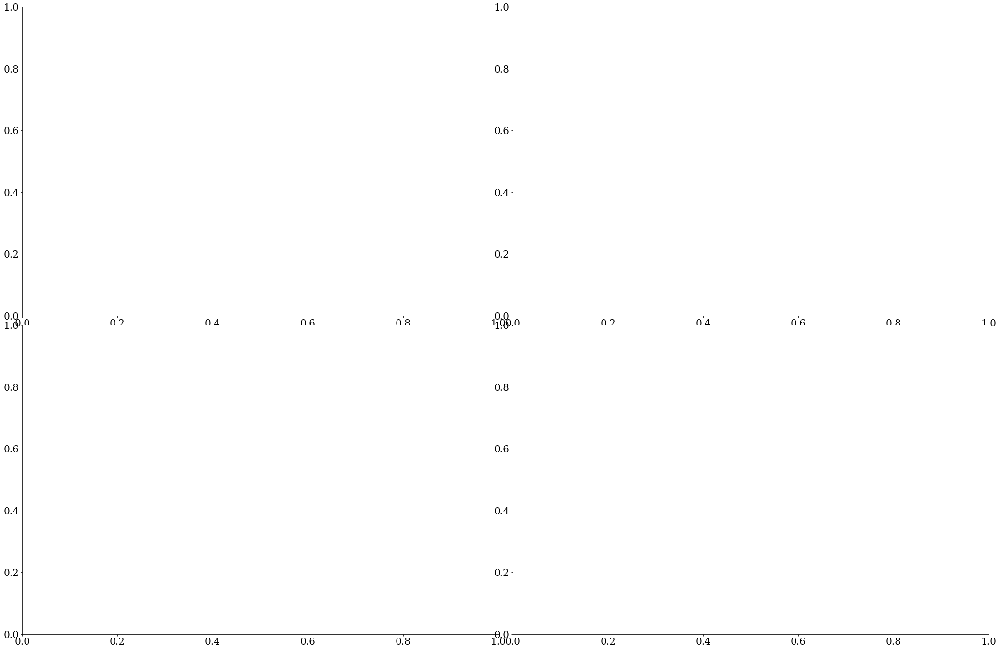

In [12]:
field = 'T';

fig_shape = (2,2)
axes = generateAxesForMultiplePlots(shape=fig_shape,figsize=(36,24),wspace=0.03,hspace=0.03)
plt.rcParams["font.family"] = "serif"
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
fontsize = 30
ideal1 = np.linspace(0.1,0.5,3)
ideal2 = np.linspace(0.2,1.2,3)


monos = [True, False]
norms = [True, False]
hs    = [0.5, 1, 2]
l=1
for i in range(2):
    for j in range(2):
        mono, norm, h = monos[i], norms[j], hs[1]
        fname = "search/TNG+SIMBA_{}_mono_{}_norm_{}_h_{}".format(field,int(mono),int(norm),h)
        mist = MIST(sim=["TNG","SIMBA"],field=field, extended_L=False, extended_dn=False,
                    normalization=norm, monopole=mono)
        mist.load_models(fname=fname, which_machine='vib+cls_a',z_dim=200, hidden=h, dr=0.5)
        y_true, y_pred = mist.make_plots(show_plot=False, data_return=True)
        axes[i,j].errorbar(y_true[l][:,0], y_pred[l][0][:,0], y_pred[l][1][:,0],linestyle="None",ecolor="grey",
                         capsize=3,zorder=0)
        axes[i,j].scatter(y_true[l][:,0], y_pred[l][0][:,0],s=20,c='k', zorder=10)
        axes[i,j].plot(ideal1,ideal1,"r",lw=3,zorder=12)
        remove_inner_axes(axes,fig_shape)
        axes[i,j].set_xlim(0.1,0.5)
        axes[i,j].set_ylim(0.1,0.5)
        if j == 0:
            ax = axes[i,j].twiny()
            ax.xaxis.tick_top()
            ax.set_xticks([])
            ax.set_xlabel(r"Monopole={}".format(mono),fontsize=fontsize)
        if i == 1:
            ax = axes[i,j].twinx()
            ax.yaxis.tick_right()
            ax.set_yticks([])
            ax.set_ylabel(r"Normalization={}".format(norm),fontsize=fontsize)
#axes[0,3].set_xlabel("$\Omega_\mathrm{m, true}$", fontsize=fontsize)
#axes[0,3].set_ylabel("$\Omega_\mathrm{m, pred}$", fontsize=fontsize)
#plt.savefig("Exploration_HI_omegam_TNG.png", dpi=200, bbox_inches='tight')

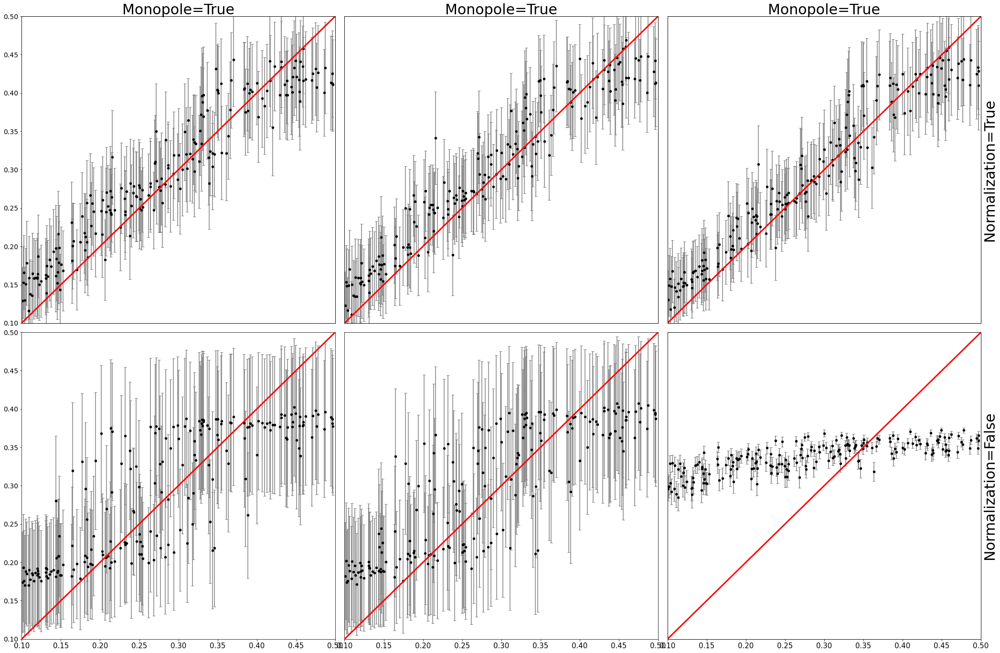

In [7]:
field = 'T';

fig_shape = (3,2)
axes = generateAxesForMultiplePlots(shape=fig_shape,figsize=(36,24),wspace=0.03,hspace=0.03)
plt.rcParams["font.family"] = "serif"
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
fontsize = 30
ideal1 = np.linspace(0.1,0.5,3)
ideal2 = np.linspace(0.2,1.2,3)


monos = [True, False]
norms = [True, False]
hs    = [0.5, 1, 2]
l=0
for i in range(3):
    for j in range(2):
        mono, norm, h = True, norms[j], hs[i]
        fname = "search/TNG+SIMBA_{}_mono_{}_norm_{}_h_{}".format(field,int(mono),int(norm),h)
        mist = MIST(sim=["TNG","SIMBA"],field=field, extended_L=False,
                    normalization=norm, monopole=mono)
        mist.load_models(fname=fname, which_machine='vib+cls_a',z_dim=200, hidden=h, dr=0.5)
        y_true, y_pred = mist.make_plots(show_plot=False, data_return=True)
        axes[i,j].errorbar(y_true[l][:,0], y_pred[l][0][:,0], y_pred[l][1][:,0],linestyle="None",ecolor="grey",
                         capsize=3,zorder=0)
        axes[i,j].scatter(y_true[l][:,0], y_pred[l][0][:,0],s=20,c='k', zorder=10)
        axes[i,j].plot(ideal1,ideal1,"r",lw=3,zorder=12)
        remove_inner_axes(axes,fig_shape)
        axes[i,j].set_xlim(0.1,0.5)
        axes[i,j].set_ylim(0.1,0.5)
        if j == 0:
            ax = axes[i,j].twiny()
            ax.xaxis.tick_top()
            ax.set_xticks([])
            ax.set_xlabel(r"Monopole={}".format(mono),fontsize=fontsize)
        if i == 2:
            ax = axes[i,j].twinx()
            ax.yaxis.tick_right()
            ax.set_yticks([])
            ax.set_ylabel(r"Normalization={}".format(norm),fontsize=fontsize)
#axes[0,3].set_xlabel("$\Omega_\mathrm{m, true}$", fontsize=fontsize)
#axes[0,3].set_ylabel("$\Omega_\mathrm{m, pred}$", fontsize=fontsize)
#plt.savefig("Exploration_HI_omegam_TNG.png", dpi=200, bbox_inches='tight')

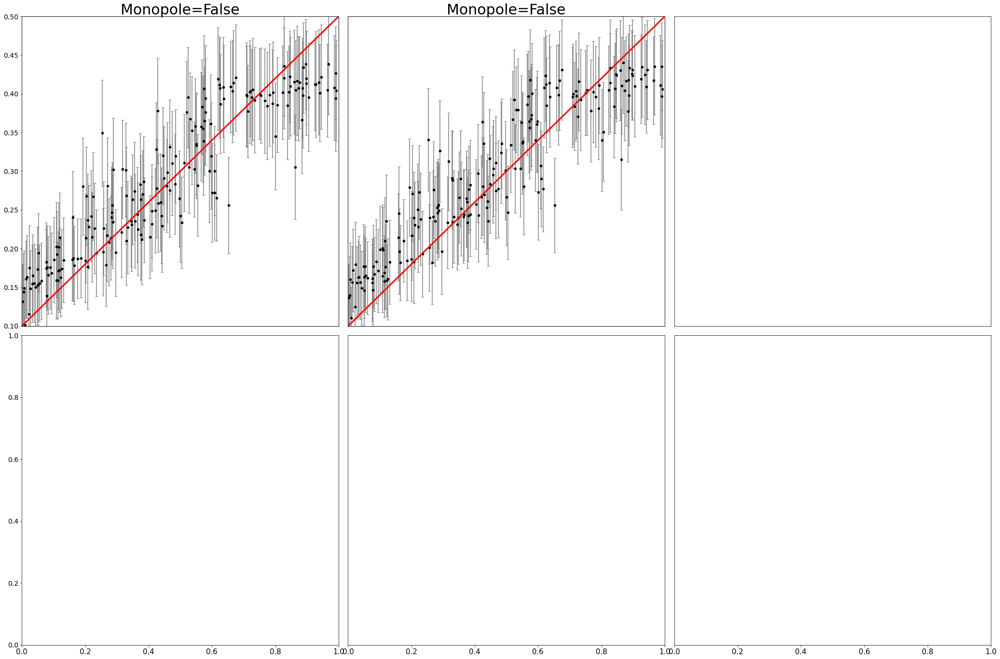

In [8]:
field = 'T';

fig_shape = (3,2)
axes = generateAxesForMultiplePlots(shape=fig_shape,figsize=(36,24),wspace=0.03,hspace=0.03)
plt.rcParams["font.family"] = "serif"
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
fontsize = 30
ideal1 = np.linspace(0.1,0.5,3)
ideal2 = np.linspace(0.2,1.2,3)


monos = [True, False]
norms = [True, False]
hs    = [0.5, 1, 2]
l=0
for i in range(2):
    for j in range(1):
        mono, norm, h = monos[1], norms[j], hs[i]
        fname = "search/TNG+SIMBA_{}_mono_{}_norm_{}_h_{}".format(field,int(mono),int(norm),h)
        mist = MIST(sim=["TNG","SIMBA"],field=field, extended_L=False,
                    normalization=norm, monopole=mono)
        mist.load_models(fname=fname, which_machine='vib+cls_a',z_dim=200, hidden=h, dr=0.5)
        y_true, y_pred = mist.make_plots(show_plot=False, data_return=True)
        axes[i,j].errorbar(y_true[l][:,0], y_pred[l][0][:,0], y_pred[l][1][:,0],linestyle="None",ecolor="grey",
                         capsize=3,zorder=0)
        axes[i,j].scatter(y_true[l][:,0], y_pred[l][0][:,0],s=20,c='k', zorder=10)
        axes[i,j].plot(ideal1,ideal1,"r",lw=3,zorder=12)
        remove_inner_axes(axes,fig_shape)
        axes[i,j].set_xlim(0.1,0.5)
        axes[i,j].set_ylim(0.1,0.5)
        if j == 0:
            ax = axes[i,j].twiny()
            ax.xaxis.tick_top()
            ax.set_xticks([])
            ax.set_xlabel(r"Monopole={}".format(mono),fontsize=fontsize)
        if i == 2:
            ax = axes[i,j].twinx()
            ax.yaxis.tick_right()
            ax.set_yticks([])
            ax.set_ylabel(r"Normalization={}".format(norm),fontsize=fontsize)
#axes[0,3].set_xlabel("$\Omega_\mathrm{m, true}$", fontsize=fontsize)
#axes[0,3].set_ylabel("$\Omega_\mathrm{m, pred}$", fontsize=fontsize)
#plt.savefig("Exploration_HI_omegam_TNG.png", dpi=200, bbox_inches='tight')

## 1. Halo mass-stellar mass relation: $p(M_{\star}|M_\mathrm{halo}, \theta)$
## 2. Stellar mass function: $\rho(M_{\star})|_{\theta=\theta_0} = \int p(M_{\star}|M_\mathrm{halo}, \theta_0)p(M_\mathrm{halo})dM_{\mathrm{halo}}$
## Here, the prior $p(M_\mathrm{halo})$ is given by simulations. We can simply compute the integral by sampling halos from simulations and adding them up accordingly. 
## 3. In training: the emulator learns the mapping $f: (M_{\star},M_\mathrm{halo}, \theta)_\mathrm{low} \mapsto p_\mathrm{high}(M_{\star}|M_\mathrm{halo}, \theta)$, so that this machine can predict probability of $M_\star$ as a function of $M_\mathrm{halo}$ and $\theta$. If Gaussian is assumed, we can predict means and variances of the distribution instead. However, I think intractable probaility distribution can be more favorable. Note that we are trying to learn one to one relation between halos and its stellar masses. 